In [4]:
! pip install pcntoolkit

  Using cached argparse-1.4.0-py2.py3-none-any.whl.metadata (2.8 kB)
Using cached argparse-1.4.0-py2.py3-none-any.whl (23 kB)


In [5]:
import os
os.chdir('D:/yanyi/PCNtoolkit-demo-main/PCNtoolkit-demo-main/braincharts-master16/braincharts-master/scripts') 

In [6]:
import numpy as np
import pandas as pd
import pickle
from matplotlib import pyplot as plt
import seaborn as sns

from pcntoolkit.normative import estimate, predict, evaluate
from pcntoolkit.util.utils import compute_MSLL, create_design_matrix
from nm_utils import remove_bad_subjects, load_2d

In [7]:
# which model do we wish to use?
model_name = 'lifespan_57K_82sites'
site_names = 'site_ids_ct_82sites.txt'

# where the analysis takes place
root_dir = 'D:/yanyi/PCNtoolkit-demo-main/PCNtoolkit-demo-main/braincharts-master16/braincharts-master'

# where the data files live
data_dir = 'D:/yanyi/PCNtoolkit-demo-main/PCNtoolkit-demo-main/braincharts-master16/braincharts-master/docs'

# where the models live
out_dir = os.path.join(root_dir, 'models', model_name)

# load a set of site ids from this model. This must match the training data
with open(os.path.join(root_dir,'docs', site_names)) as f:
    site_ids_tr = f.read().splitlines()
print (site_ids_tr)

['ABCD_01', 'ABCD_02', 'ABCD_03', 'ABCD_04', 'ABCD_05', 'ABCD_06', 'ABCD_07', 'ABCD_08', 'ABCD_09', 'ABCD_10', 'ABCD_11', 'ABCD_12', 'ABCD_13', 'ABCD_14', 'ABCD_15', 'ABCD_16', 'ABCD_17', 'ABCD_18', 'ABCD_19', 'ABCD_20', 'ABCD_21', 'ABIDE_GU', 'ABIDE_KKI', 'ABIDE_NYU', 'ABIDE_USM', 'ADD200_KKI', 'ADD200_NYU', 'AOMIC_1000', 'AOMIC_PIPO2', 'ATV', 'CIN', 'CMI_CBIC', 'CMI_RU', 'CMI_SI', 'CNP-35343.0', 'CNP-35426.0', 'COI', 'HCP_A_MGH', 'HCP_A_UCLA', 'HCP_A_UM', 'HCP_A_WU', 'HCP_D_MGH', 'HCP_D_UCLA', 'HCP_D_UM', 'HCP_D_WU', 'HCP_EP_BWH', 'HCP_EP_IU', 'HCP_EP_MGH', 'HCP_EP_McL', 'HKH', 'HRC', 'HUH', 'KCL', 'KTT', 'KUT', 'Oasis2', 'Oasis3', 'SWA', 'SWU_SLIM_ses1', 'UCDavis', 'UMich_CWS', 'UMich_IMPs', 'UMich_MLS', 'UMich_MTwins', 'UMich_SAD', 'UMich_SZG', 'UTO', 'cam', 'delta', 'ds001734', 'ds002236', 'ds002330', 'ds002345', 'ds002731', 'ds002837', 'hcp_ya', 'ixi', 'nki', 'pnc', 'top', 'ukb-11025.0', 'ukb-11027.0']


In [8]:
test_data = os.path.join(data_dir, 'SLE_testfinal.csv')

df_te = pd.read_csv(test_data)

# extract a list of unique site ids from the test set
site_ids_te =  sorted(set(df_te['site'].to_list()))

In [9]:
adaptation_data = os.path.join(data_dir, 'HC_ad40.csv')

df_ad = pd.read_csv(adaptation_data)

# extract a list of unique site ids from the test set
site_ids_ad =  sorted(set(df_ad['site'].to_list()))

if not all(elem in site_ids_ad for elem in site_ids_te):
    print('Warning: some of the testing sites are not in the adaptation data')

In [10]:
# load the list of idps for left and right hemispheres, plus subcortical regions
with open(os.path.join(data_dir, 'phenotypes_ct_lh.txt')) as f:
    idp_ids_lh = f.read().splitlines()
with open(os.path.join(data_dir, 'phenotypes_ct_rh.txt')) as f:
    idp_ids_rh = f.read().splitlines()

# we choose here to process all idps
idp_ids = idp_ids_lh + idp_ids_rh

In [11]:
# which data columns do we wish to use as covariates? 
cols_cov = ['age','sex']

# limits for cubic B-spline basis 
xmin = -5 
xmax = 110

# Absolute Z treshold above which a sample is considered to be an outlier (without fitting any model)
outlier_thresh = 7


In [12]:
for idp_num, idp in enumerate(idp_ids): 
    print('Running IDP', idp_num, idp, ':')
    idp_dir = os.path.join(out_dir, idp)
    os.chdir(idp_dir)
    
    # extract and save the response variables for the test set
    y_te = df_te[idp].to_numpy()
    
    # save the variables
    resp_file_te = os.path.join(idp_dir, 'resp_te.txt') 
    np.savetxt(resp_file_te, y_te)
        
    # configure and save the design matrix
    cov_file_te = os.path.join(idp_dir, 'cov_bspline_te.txt')
    X_te = create_design_matrix(df_te[cols_cov], 
                                site_ids = df_te['site'],
                                all_sites = site_ids_tr,
                                basis = 'bspline', 
                                xmin = xmin, 
                                xmax = xmax)
    np.savetxt(cov_file_te, X_te)
    
    # check whether all sites in the test set are represented in the training set
    if all(elem in site_ids_tr for elem in site_ids_te):
        print('All sites are present in the training data')
        
        # just make predictions
        yhat_te, s2_te, Z = predict(cov_file_te, 
                                    alg='blr', 
                                    respfile=resp_file_te, 
                                    model_path=os.path.join(idp_dir,'Models'))
    else:
        print('Some sites missing from the training data. Adapting model')
        
        # save the covariates for the adaptation data
        X_ad = create_design_matrix(df_ad[cols_cov], 
                                    site_ids = df_ad['site'],
                                    all_sites = site_ids_tr,
                                    basis = 'bspline', 
                                    xmin = xmin, 
                                    xmax = xmax)
        cov_file_ad = os.path.join(idp_dir, 'cov_bspline_ad.txt')          
        np.savetxt(cov_file_ad, X_ad)
        
        # save the responses for the adaptation data
        resp_file_ad = os.path.join(idp_dir, 'resp_ad.txt') 
        y_ad = df_ad[idp].to_numpy()
        np.savetxt(resp_file_ad, y_ad)
       
        # save the site ids for the adaptation data
        sitenum_file_ad = os.path.join(idp_dir, 'sitenum_ad.txt') 
        site_num_ad = df_ad['sitenum'].to_numpy(dtype=int)
        np.savetxt(sitenum_file_ad, site_num_ad)
        
        # save the site ids for the test data 
        sitenum_file_te = os.path.join(idp_dir, 'sitenum_te.txt')
        site_num_te = df_te['sitenum'].to_numpy(dtype=int)
        np.savetxt(sitenum_file_te, site_num_te)
         
        yhat_te, s2_te, Z = predict(cov_file_te, 
                                    alg = 'blr', 
                                    respfile = resp_file_te, 
                                    model_path = os.path.join(idp_dir,'Models'),
                                    adaptrespfile = resp_file_ad,
                                    adaptcovfile = cov_file_ad,
                                    adaptvargroupfile = sitenum_file_ad,
                                    testvargroupfile = sitenum_file_te)

Running IDP 0 lh_G&S_frontomargin_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 1 lh_G&S_occipital_inf_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 2 lh_G&S_paracentral_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 3 lh_G&S_subcentral_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 4 lh_G&S_transv_frontopol_thickness :
Some sites missing from the training data. Adapt

Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 37 lh_G_temporal_middle_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 38 lh_Lat_Fis-ant-Horizont_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 39 lh_Lat_Fis-ant-Vertical_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 40 lh_Lat_Fis-post_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running ID

Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 74 rh_G&S_frontomargin_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 75 rh_G&S_occipital_inf_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 76 rh_G&S_paracentral_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 77 rh_G&S_subcentral_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outp

Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 111 rh_G_temporal_middle_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 112 rh_Lat_Fis-ant-Horizont_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 113 rh_Lat_Fis-ant-Vertical_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Running IDP 114 rh_Lat_Fis-post_thickness :
Some sites missing from the training data. Adapting model
Loading data ...
Prediction by model  1 of 1
Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...
Runnin

Evaluating the model ...
Evaluations Writing outputs ...
Writing outputs ...


In [16]:
# which sex do we want to plot? 
sex = 0 # 1 = male 0 = female
if sex == 1: 
    clr = 'blue';
else:
    clr = 'lightskyblue'

# create dummy data for visualisation
print('configuring dummy data ...')
xx = np.arange(xmin, xmax, 0.5)
X0_dummy = np.zeros((len(xx), 2))
X0_dummy[:,0] = xx
X0_dummy[:,1] = sex

# create the design matrix
X_dummy = create_design_matrix(X0_dummy, xmin=xmin, xmax=xmax, site_ids=None, all_sites=site_ids_tr)

# save the dummy covariates
cov_file_dummy = os.path.join(out_dir,'cov_bspline_dummy_mean.txt')
np.savetxt(cov_file_dummy, X_dummy)

configuring dummy data ...


Running IDP 0 lh_G&S_frontomargin_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21462291]), 'Rho': array([0.81563538]), 'pRho': array([2.71980152e-36]), 'SMSE': array([0.48804716]), 'EXPV': array([0.664507])}


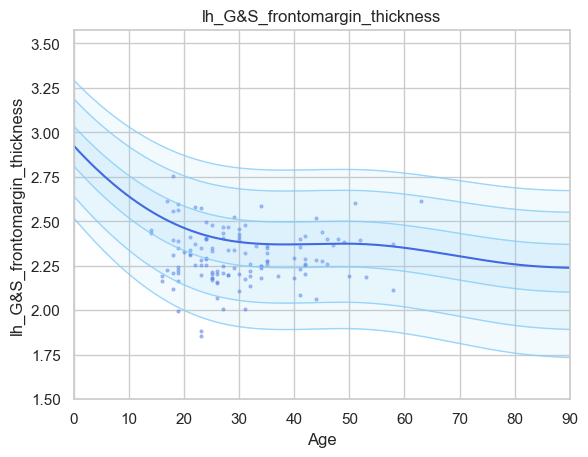

Running IDP 1 lh_G&S_occipital_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15369376]), 'Rho': array([-0.00267467]), 'pRho': array([0.97652846]), 'SMSE': array([1.28798078]), 'EXPV': array([-0.15511227])}


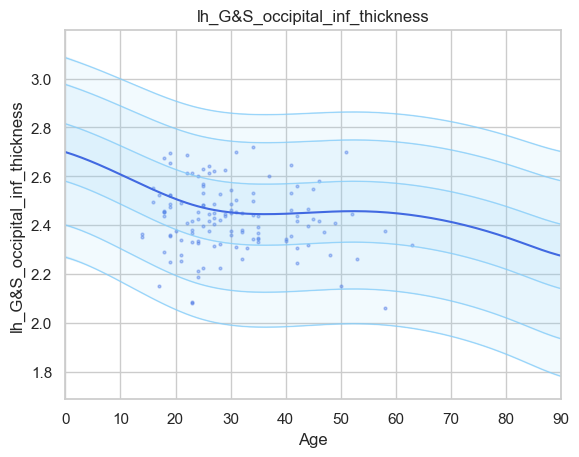

Running IDP 2 lh_G&S_paracentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16276919]), 'Rho': array([0.29427978]), 'pRho': array([0.00085085]), 'SMSE': array([1.20804268]), 'EXPV': array([-0.03090184])}


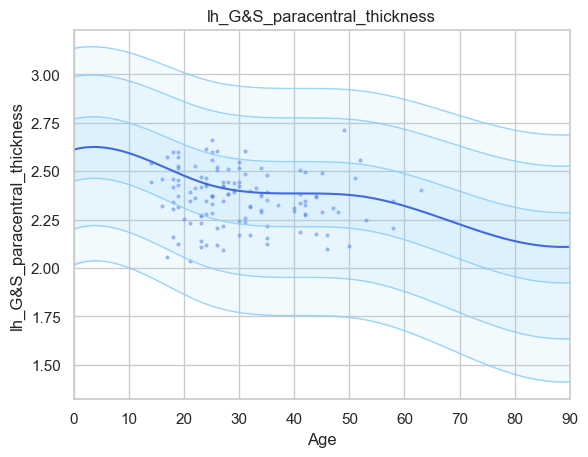

Running IDP 3 lh_G&S_subcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15043045]), 'Rho': array([0.63595001]), 'pRho': array([1.39949451e-16]), 'SMSE': array([0.72784065]), 'EXPV': array([0.31405589])}


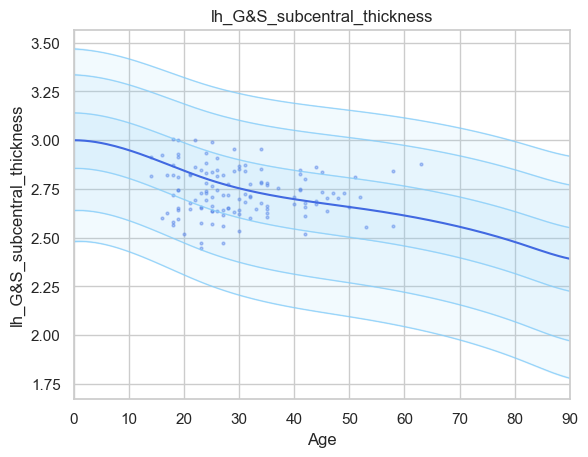

Running IDP 4 lh_G&S_transv_frontopol_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22102903]), 'Rho': array([0.88121409]), 'pRho': array([3.93947312e-52]), 'SMSE': array([0.27406704]), 'EXPV': array([0.76866543])}


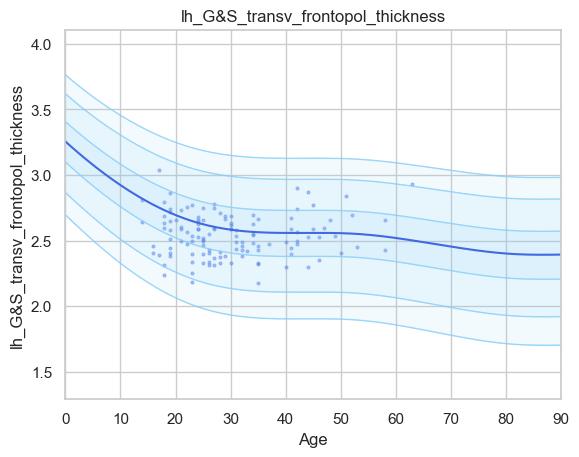

Running IDP 5 lh_G&S_cingul-Ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19254282]), 'Rho': array([0.29197001]), 'pRho': array([0.00093997]), 'SMSE': array([1.0136377]), 'EXPV': array([0.05741354])}


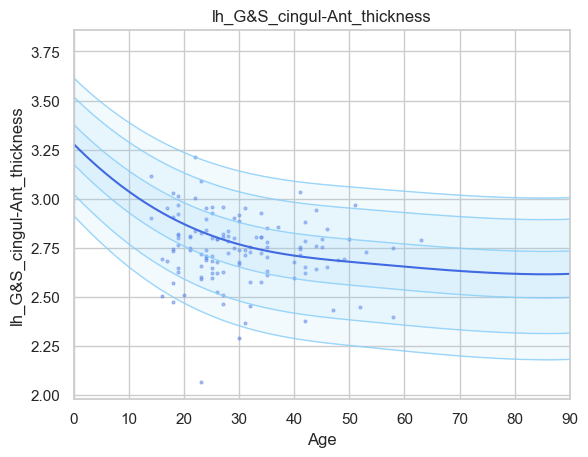

Running IDP 6 lh_G&S_cingul-Mid-Ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18314253]), 'Rho': array([0.4561332]), 'pRho': array([6.07449245e-08]), 'SMSE': array([1.06525725]), 'EXPV': array([0.16875118])}


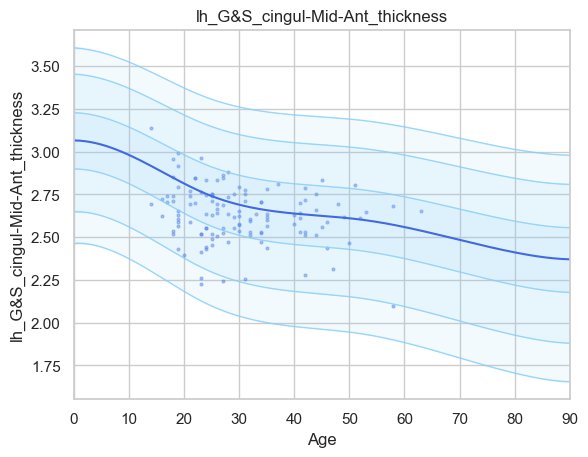

Running IDP 7 lh_G&S_cingul-Mid-Post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16445893]), 'Rho': array([0.35393101]), 'pRho': array([4.71674284e-05]), 'SMSE': array([1.27091339]), 'EXPV': array([-0.13617278])}


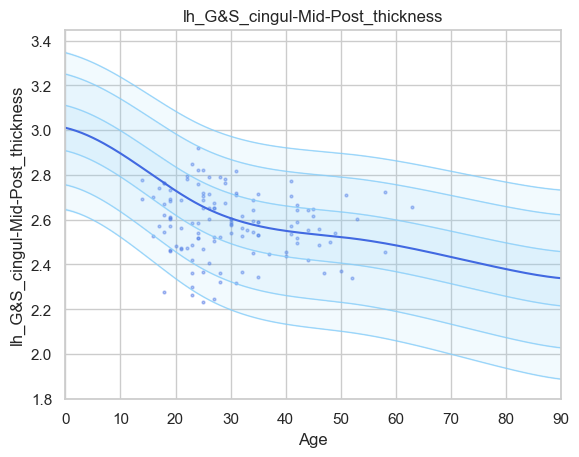

Running IDP 8 lh_G_cingul-Post-dorsal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17775022]), 'Rho': array([0.21413002]), 'pRho': array([0.01673611]), 'SMSE': array([1.06930062]), 'EXPV': array([-0.04029803])}


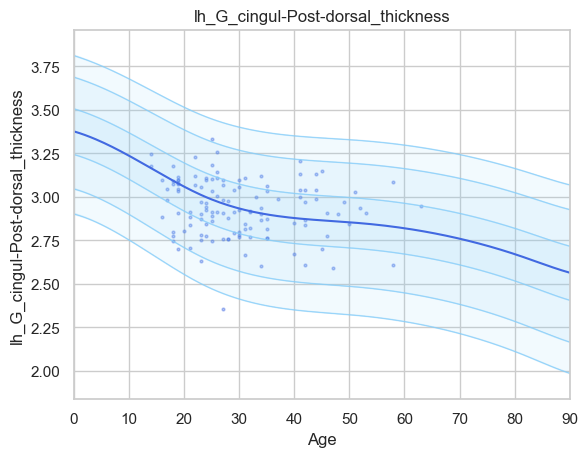

Running IDP 9 lh_G_cingul-Post-ventral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.25860657]), 'Rho': array([0.25121145]), 'pRho': array([0.00474639]), 'SMSE': array([1.20924467]), 'EXPV': array([0.03531997])}


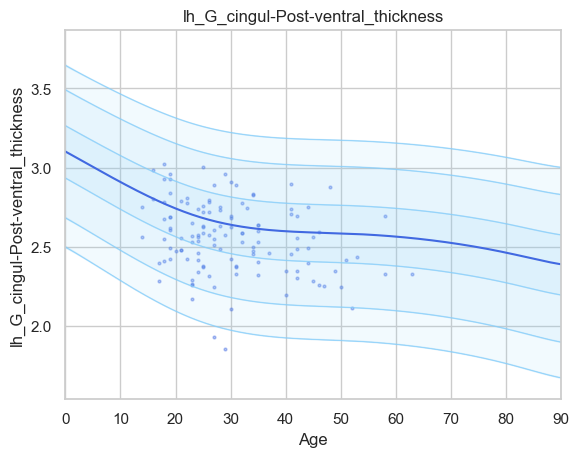

Running IDP 10 lh_G_cuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13947068]), 'Rho': array([0.32770845]), 'pRho': array([0.00018195]), 'SMSE': array([1.1906167]), 'EXPV': array([0.03642463])}


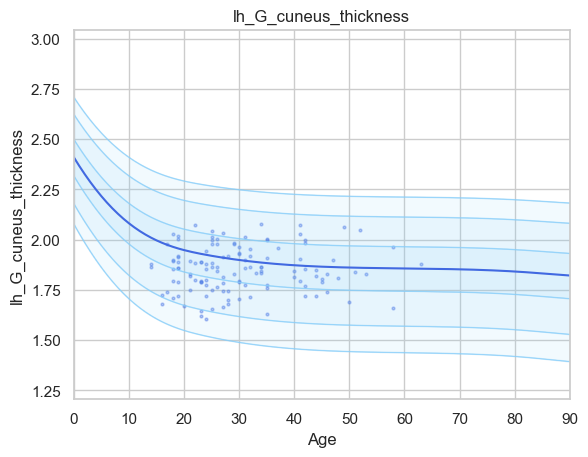

Running IDP 11 lh_G_front_inf-Opercular_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16228896]), 'Rho': array([0.69490153]), 'pRho': array([4.0581285e-21]), 'SMSE': array([0.78114205]), 'EXPV': array([0.44712857])}


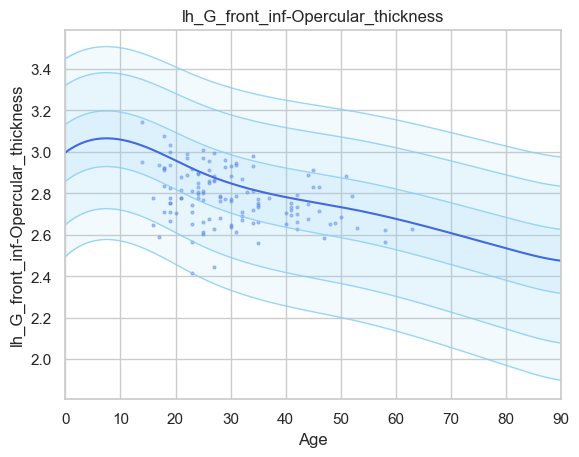

Running IDP 12 lh_G_front_inf-Orbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19572478]), 'Rho': array([0.67975149]), 'pRho': array([7.85464362e-20]), 'SMSE': array([0.57604758]), 'EXPV': array([0.46135471])}


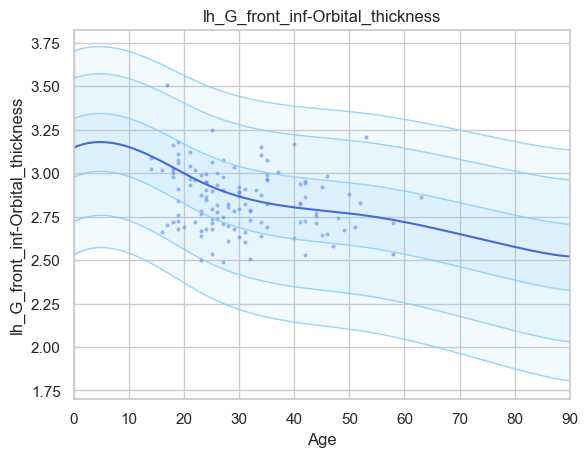

Running IDP 13 lh_G_front_inf-Triangul_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16707108]), 'Rho': array([0.7381848]), 'pRho': array([2.20269073e-25]), 'SMSE': array([0.6467598]), 'EXPV': array([0.48359587])}


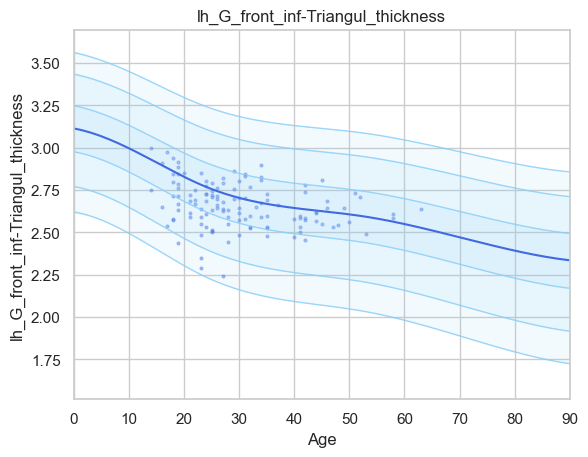

Running IDP 14 lh_G_front_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16975303]), 'Rho': array([0.77084396]), 'pRho': array([2.41112833e-29]), 'SMSE': array([0.49708972]), 'EXPV': array([0.56011198])}


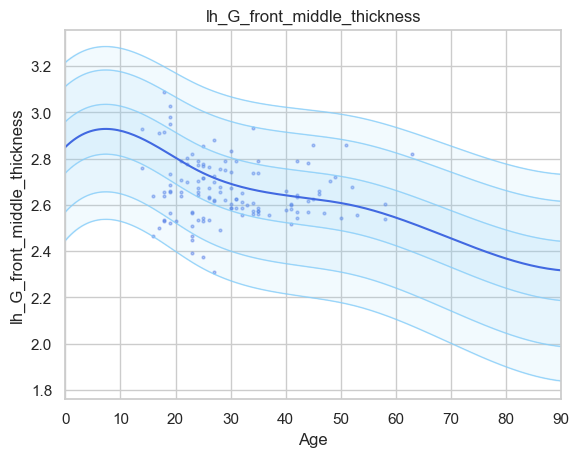

Running IDP 15 lh_G_front_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18441552]), 'Rho': array([0.68915142]), 'pRho': array([1.28174472e-20]), 'SMSE': array([0.72185099]), 'EXPV': array([0.45287341])}


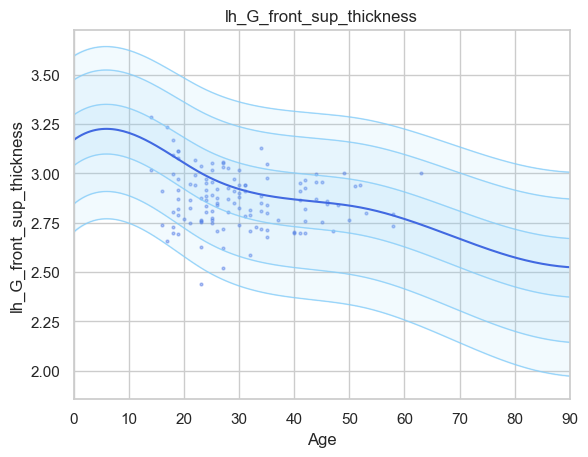

Running IDP 16 lh_G_Ins_lg&S_cent_ins_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.37614082]), 'Rho': array([-0.02995548]), 'pRho': array([0.74169548]), 'SMSE': array([1.08067842]), 'EXPV': array([-0.05783607])}


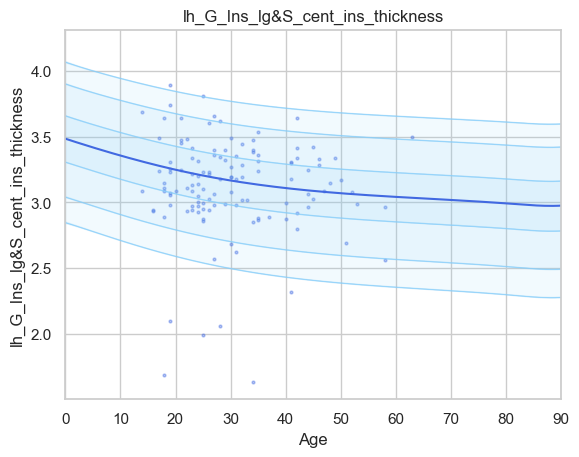

Running IDP 17 lh_G_insular_short_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.33429684]), 'Rho': array([-0.05028344]), 'pRho': array([0.57986308]), 'SMSE': array([1.0749734]), 'EXPV': array([-0.07471502])}


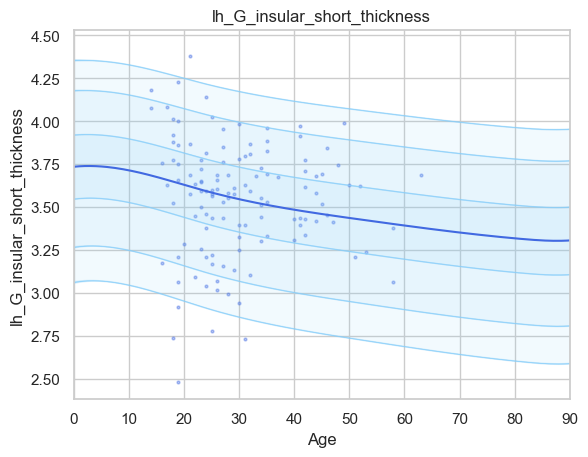

Running IDP 18 lh_G_occipital_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1407548]), 'Rho': array([0.26228467]), 'pRho': array([0.00313518]), 'SMSE': array([1.22827233]), 'EXPV': array([-0.00012348])}


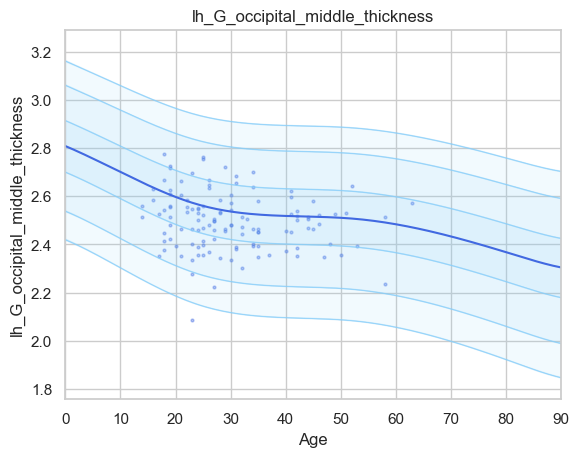

Running IDP 19 lh_G_occipital_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13792351]), 'Rho': array([0.2367951]), 'pRho': array([0.00792762]), 'SMSE': array([1.15824971]), 'EXPV': array([0.02561979])}


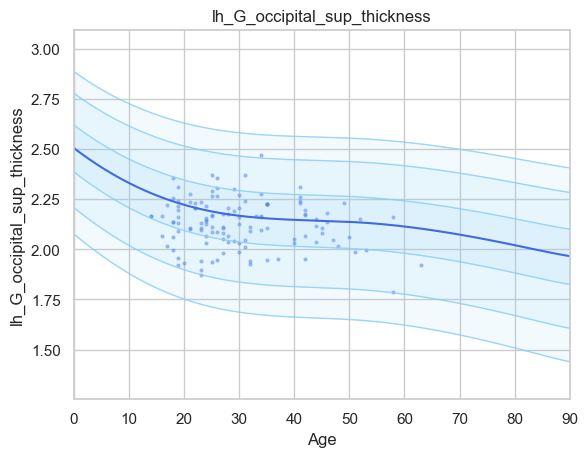

Running IDP 20 lh_G_oc-temp_lat-fusifor_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16829301]), 'Rho': array([0.07300719]), 'pRho': array([0.4211022]), 'SMSE': array([1.31496846]), 'EXPV': array([-0.23025032])}


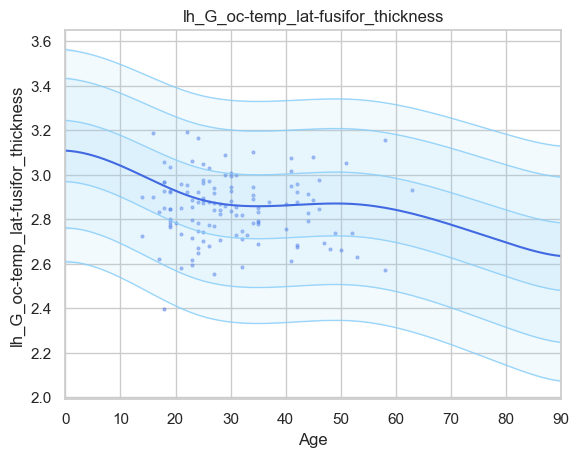

Running IDP 21 lh_G_oc-temp_med-Lingual_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14228306]), 'Rho': array([0.29158934]), 'pRho': array([0.00095545]), 'SMSE': array([1.20348772]), 'EXPV': array([-0.08724867])}


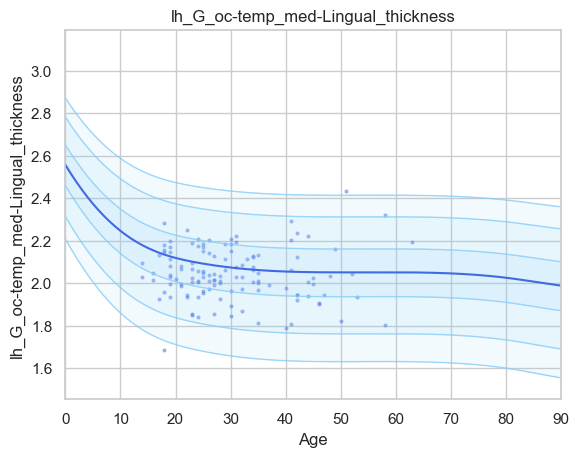

Running IDP 22 lh_G_oc-temp_med-Parahip_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17784431]), 'Rho': array([0.60185056]), 'pRho': array([1.91097308e-14]), 'SMSE': array([0.73476823]), 'EXPV': array([0.36222069])}


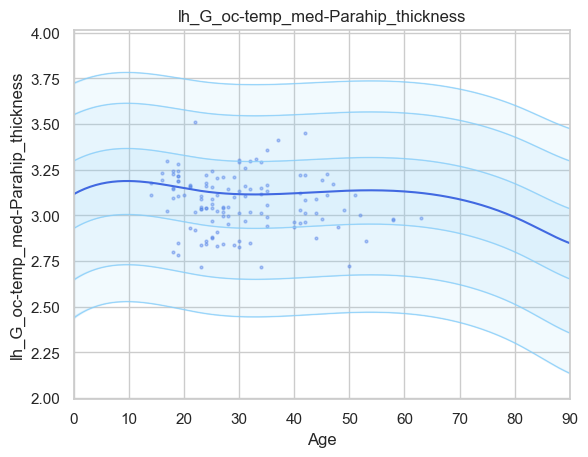

Running IDP 23 lh_G_orbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16195343]), 'Rho': array([0.64381671]), 'pRho': array([4.05427722e-17]), 'SMSE': array([0.70760035]), 'EXPV': array([0.41166555])}


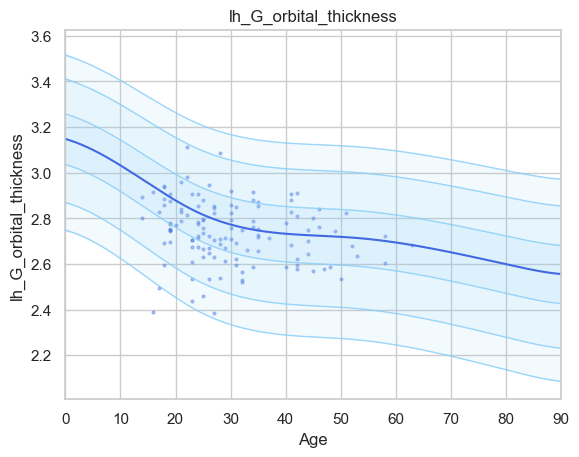

Running IDP 24 lh_G_pariet_inf-Angular_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16727397]), 'Rho': array([0.56469675]), 'pRho': array([1.96811947e-12]), 'SMSE': array([0.86512357]), 'EXPV': array([0.25362458])}


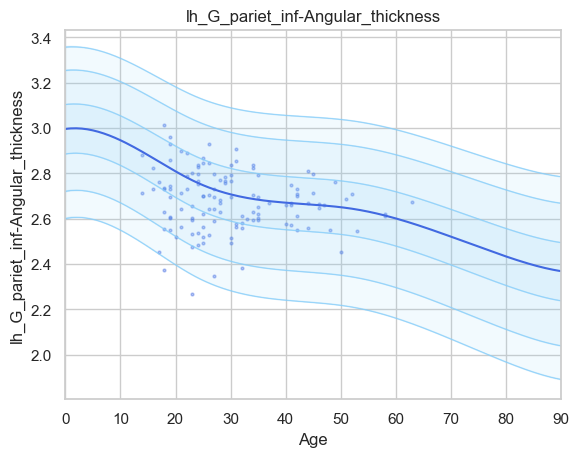

Running IDP 25 lh_G_pariet_inf-Supramar_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17771384]), 'Rho': array([0.70158951]), 'pRho': array([1.0218853e-21]), 'SMSE': array([0.63124079]), 'EXPV': array([0.40117002])}


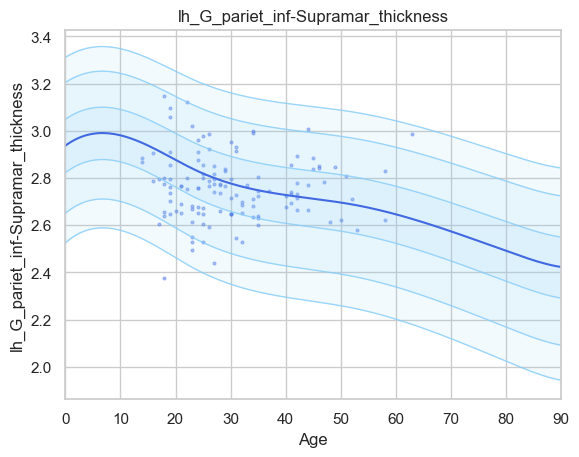

Running IDP 26 lh_G_parietal_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15402263]), 'Rho': array([0.37983474]), 'pRho': array([1.08985743e-05]), 'SMSE': array([1.21649965]), 'EXPV': array([0.03880739])}


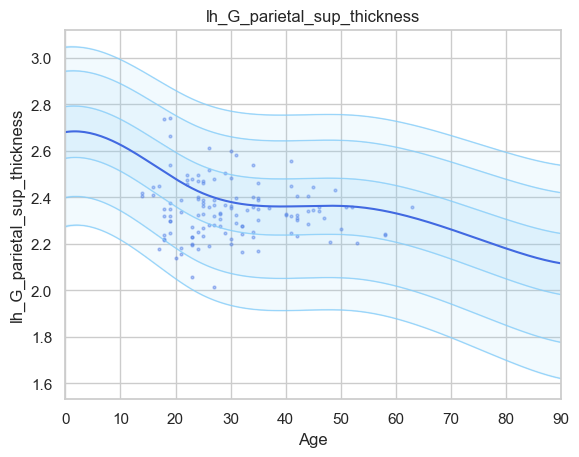

Running IDP 27 lh_G_postcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15526898]), 'Rho': array([0.52901324]), 'pRho': array([9.38662883e-11]), 'SMSE': array([0.88647793]), 'EXPV': array([0.22617552])}


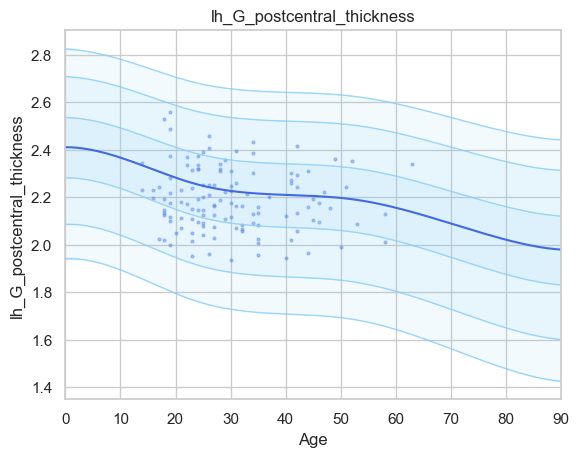

Running IDP 28 lh_G_precentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14156122]), 'Rho': array([0.34178451]), 'pRho': array([8.95728654e-05]), 'SMSE': array([1.08568132]), 'EXPV': array([0.02140698])}


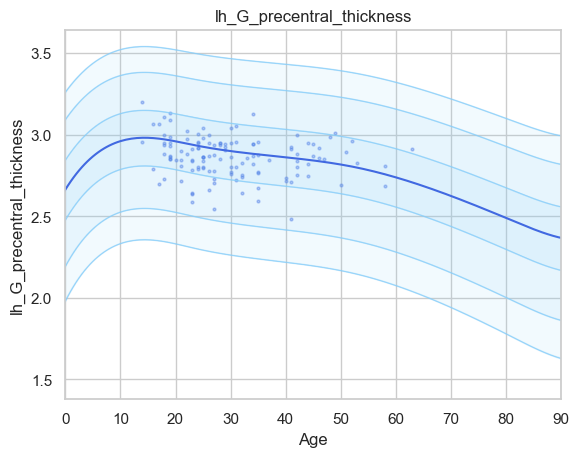

Running IDP 29 lh_G_precuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14920949]), 'Rho': array([0.21655884]), 'pRho': array([0.01550043]), 'SMSE': array([1.39289869]), 'EXPV': array([-0.14118302])}


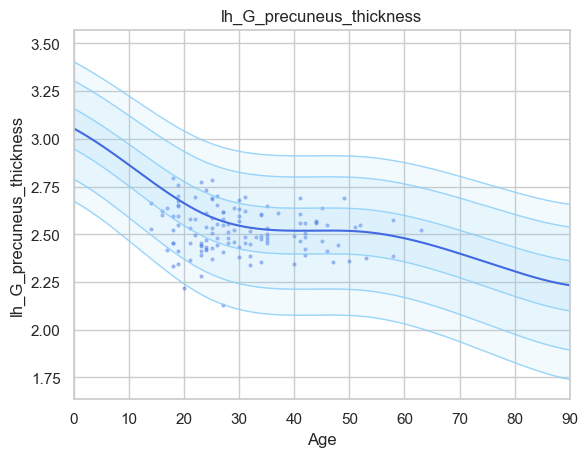

Running IDP 30 lh_G_rectus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1642299]), 'Rho': array([0.80511855]), 'pRho': array([1.83258543e-34]), 'SMSE': array([0.39780942]), 'EXPV': array([0.63734925])}


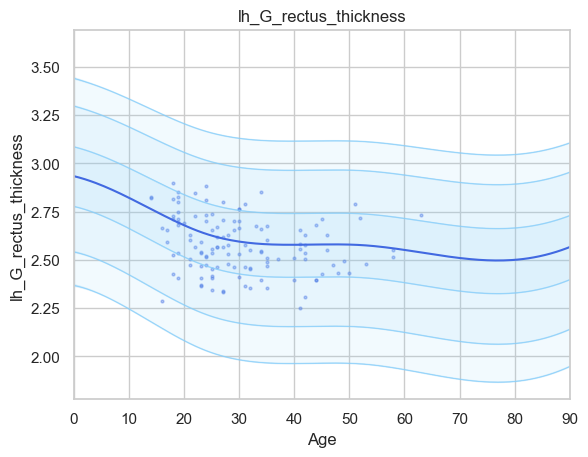

Running IDP 31 lh_G_subcallosal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.32648285]), 'Rho': array([-0.06383846]), 'pRho': array([0.48194401]), 'SMSE': array([1.10960103]), 'EXPV': array([-0.10256424])}


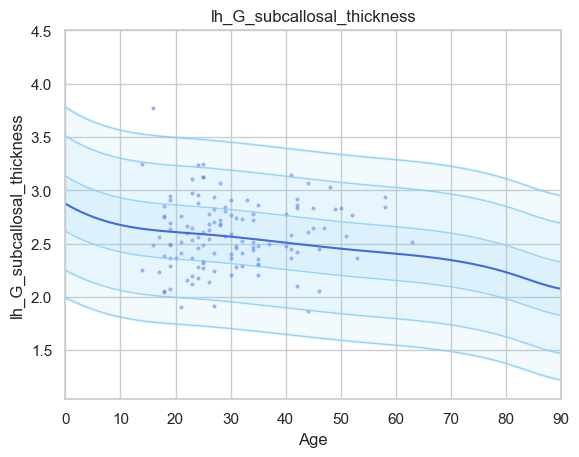

Running IDP 32 lh_G_temp_sup-G_T_transv_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.2200815]), 'Rho': array([0.14697899]), 'pRho': array([0.10340525]), 'SMSE': array([1.32998708]), 'EXPV': array([-0.08800584])}


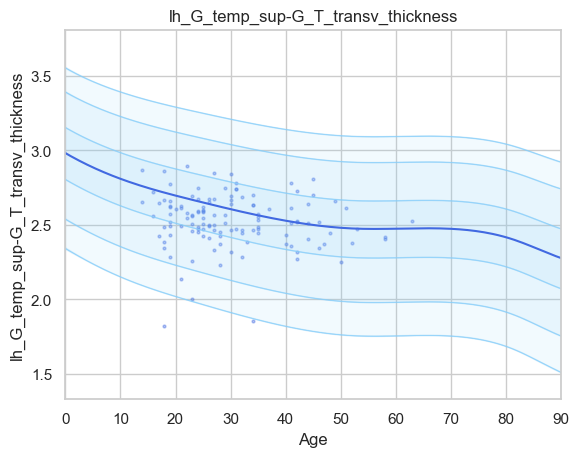

Running IDP 33 lh_G_temp_sup-Lateral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20405606]), 'Rho': array([0.61549067]), 'pRho': array([2.90681444e-15]), 'SMSE': array([0.96369892]), 'EXPV': array([0.20702922])}


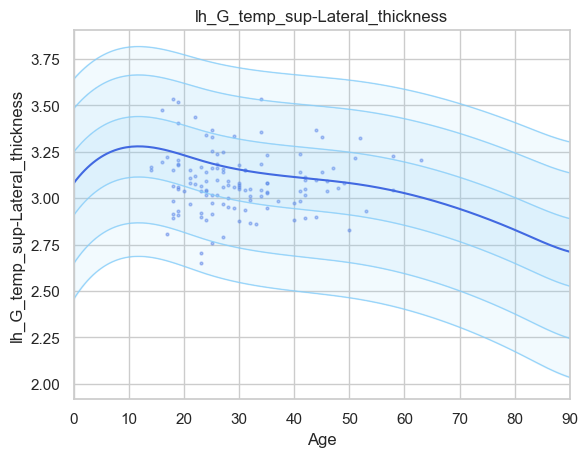

Running IDP 34 lh_G_temp_sup-Plan_polar_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22726001]), 'Rho': array([0.32453614]), 'pRho': array([0.00021239]), 'SMSE': array([0.94137471]), 'EXPV': array([0.09394285])}


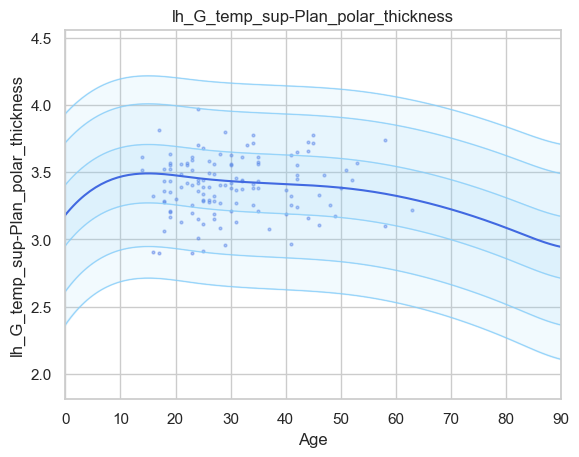

Running IDP 35 lh_G_temp_sup-Plan_tempo_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17698129]), 'Rho': array([0.65390129]), 'pRho': array([7.770977e-18]), 'SMSE': array([0.73267998]), 'EXPV': array([0.3590078])}


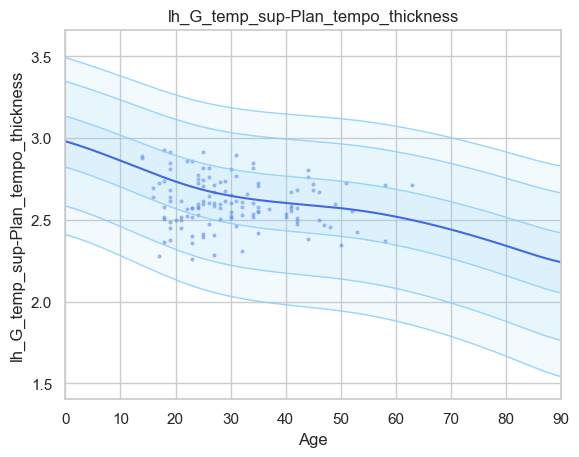

Running IDP 36 lh_G_temporal_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17148242]), 'Rho': array([0.5959269]), 'pRho': array([4.19253028e-14]), 'SMSE': array([0.69205623]), 'EXPV': array([0.32620108])}


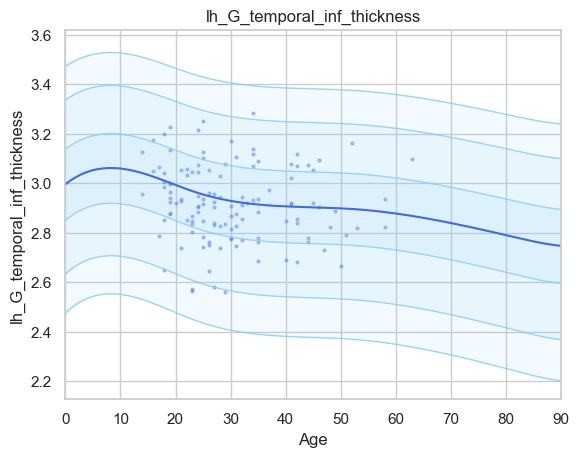

Running IDP 37 lh_G_temporal_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19438778]), 'Rho': array([0.57908204]), 'pRho': array([3.54503857e-13]), 'SMSE': array([0.83688269]), 'EXPV': array([0.16569388])}


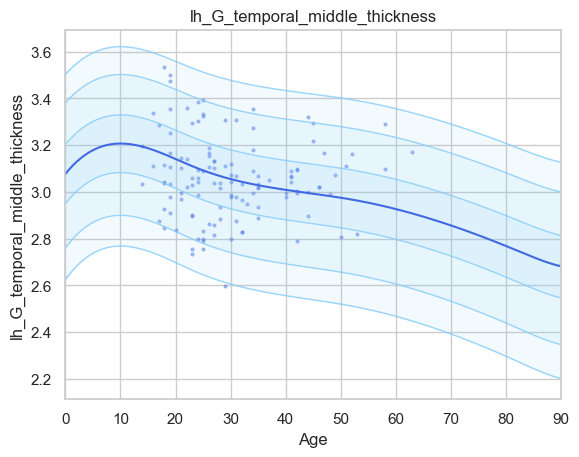

Running IDP 38 lh_Lat_Fis-ant-Horizont_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22951006]), 'Rho': array([0.65435003]), 'pRho': array([7.20775821e-18]), 'SMSE': array([0.64129351]), 'EXPV': array([0.42714121])}


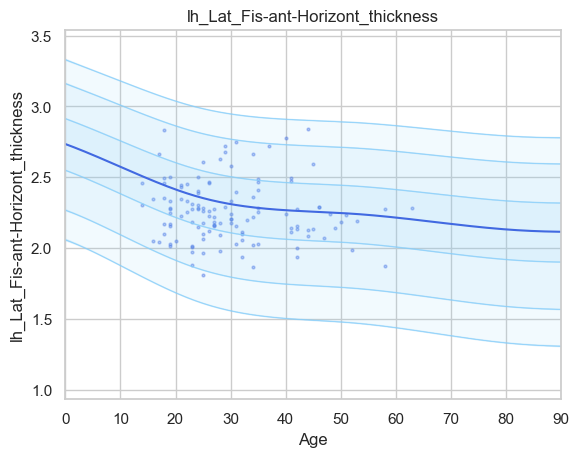

Running IDP 39 lh_Lat_Fis-ant-Vertical_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20603013]), 'Rho': array([0.66050959]), 'pRho': array([2.52681786e-18]), 'SMSE': array([0.66217305]), 'EXPV': array([0.43396106])}


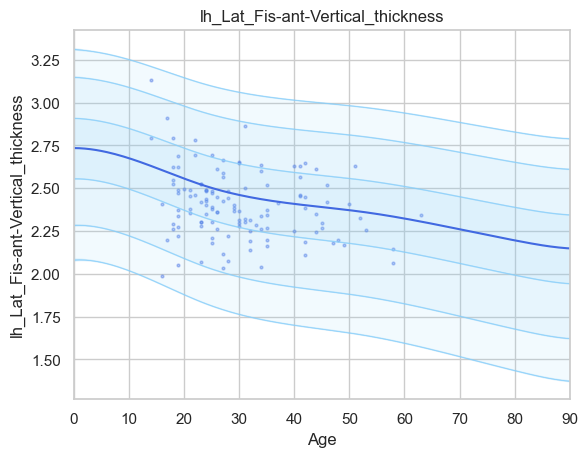

Running IDP 40 lh_Lat_Fis-post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16177884]), 'Rho': array([0.25199905]), 'pRho': array([0.00461121]), 'SMSE': array([1.11033898]), 'EXPV': array([-0.03122539])}


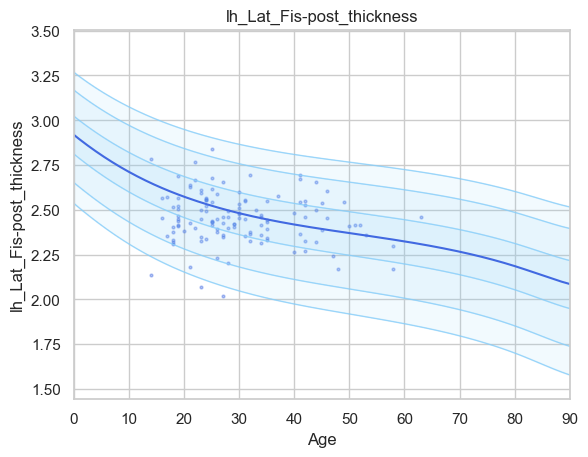

Running IDP 41 lh_Pole_occipital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15900427]), 'Rho': array([0.05618154]), 'pRho': array([0.53614803]), 'SMSE': array([1.42117294]), 'EXPV': array([0.00255381])}


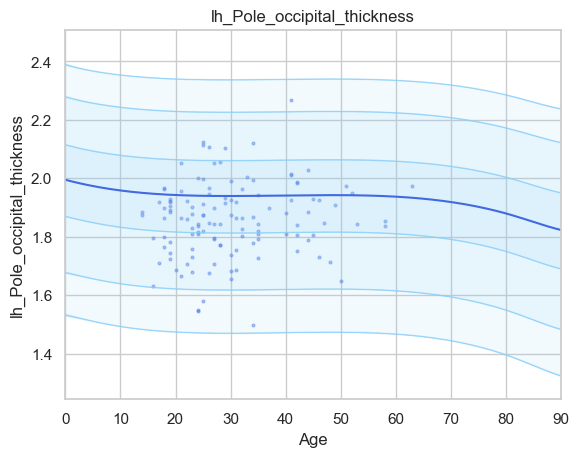

Running IDP 42 lh_Pole_temporal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.23123342]), 'Rho': array([0.4505462]), 'pRho': array([9.3337438e-08]), 'SMSE': array([0.8084764]), 'EXPV': array([0.19398894])}


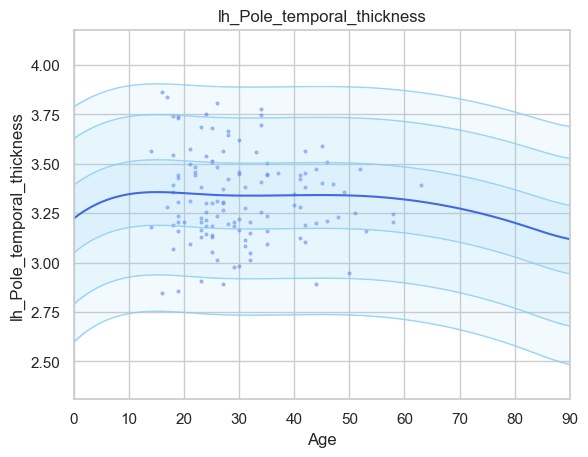

Running IDP 43 lh_S_calcarine_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13331649]), 'Rho': array([0.47107989]), 'pRho': array([1.84403841e-08]), 'SMSE': array([1.03952457]), 'EXPV': array([0.05438579])}


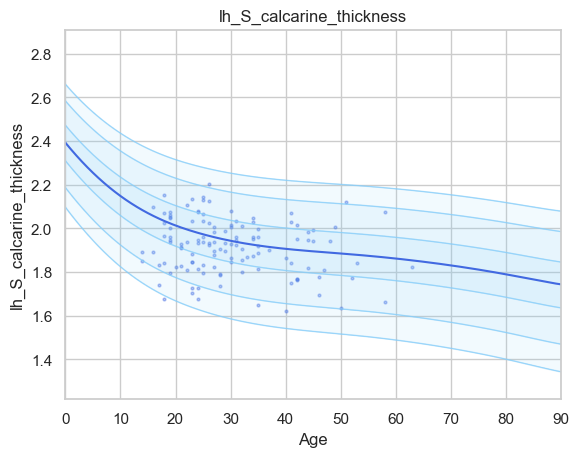

Running IDP 44 lh_S_central_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14575744]), 'Rho': array([0.31503194]), 'pRho': array([0.00033407]), 'SMSE': array([1.33176716]), 'EXPV': array([0.00697292])}


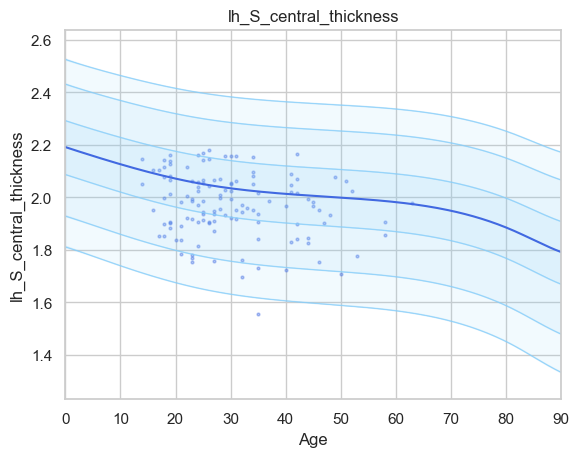

Running IDP 45 lh_S_cingul-Marginalis_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16169988]), 'Rho': array([0.27035355]), 'pRho': array([0.00229072]), 'SMSE': array([1.34531314]), 'EXPV': array([-0.04734866])}


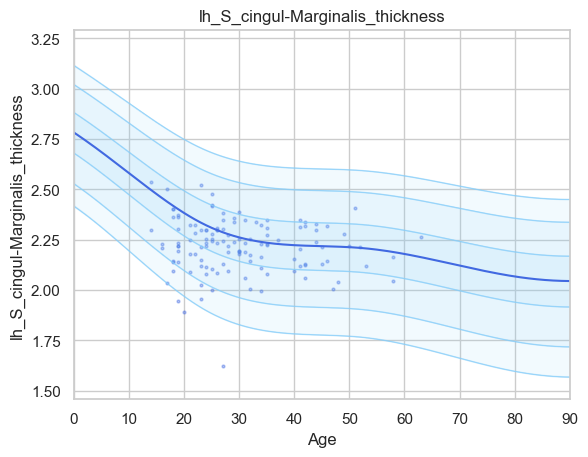

Running IDP 46 lh_S_circular_insula_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.24493602]), 'Rho': array([0.43229479]), 'pRho': array([3.58309317e-07]), 'SMSE': array([0.85591308]), 'EXPV': array([0.18043894])}


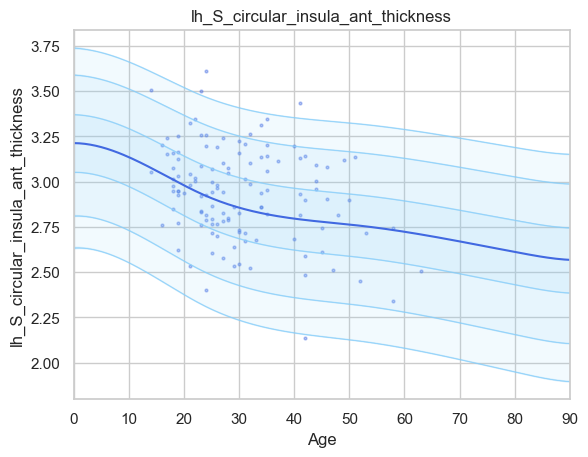

Running IDP 47 lh_S_circular_insula_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.33222331]), 'Rho': array([-0.09754977]), 'pRho': array([0.28171678]), 'SMSE': array([1.28167142]), 'EXPV': array([-0.13786765])}


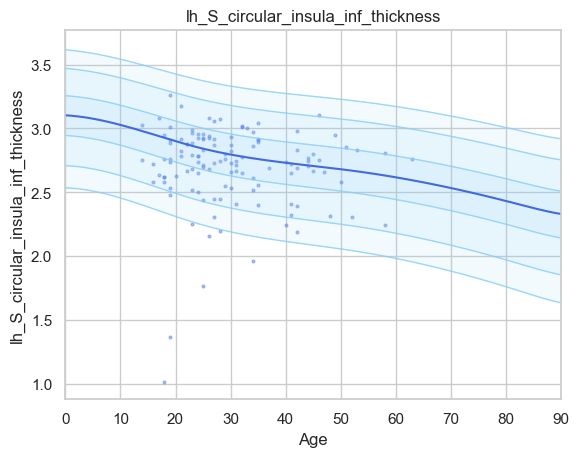

Running IDP 48 lh_S_circular_insula_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18797013]), 'Rho': array([0.33352274]), 'pRho': array([0.00013637]), 'SMSE': array([0.95239024]), 'EXPV': array([0.10917499])}


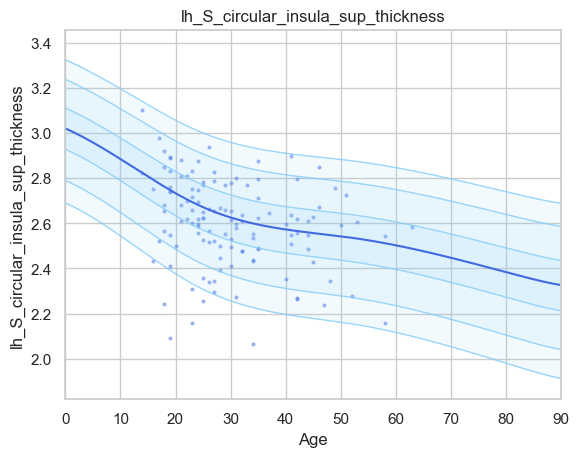

Running IDP 49 lh_S_collat_transv_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.2011638]), 'Rho': array([0.49866664]), 'pRho': array([1.71394538e-09]), 'SMSE': array([0.98812653]), 'EXPV': array([0.21267484])}


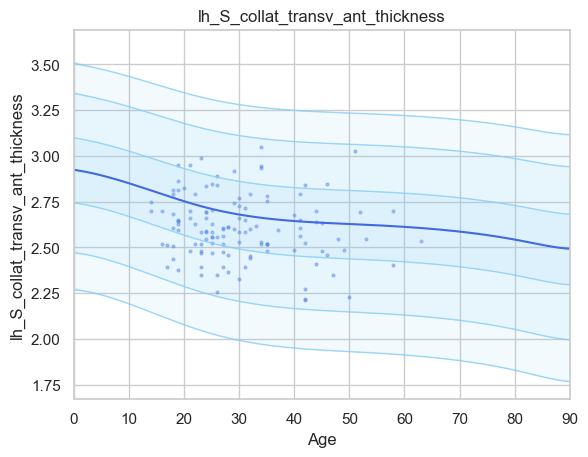

Running IDP 50 lh_S_collat_transv_post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15618687]), 'Rho': array([0.20411362]), 'pRho': array([0.02277226]), 'SMSE': array([1.02210279]), 'EXPV': array([0.0164946])}


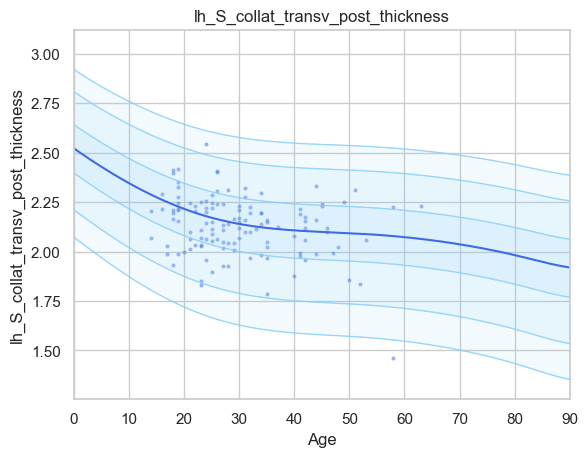

Running IDP 51 lh_S_front_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16712132]), 'Rho': array([0.6720321]), 'pRho': array([3.28124285e-19]), 'SMSE': array([0.68568973]), 'EXPV': array([0.44038368])}


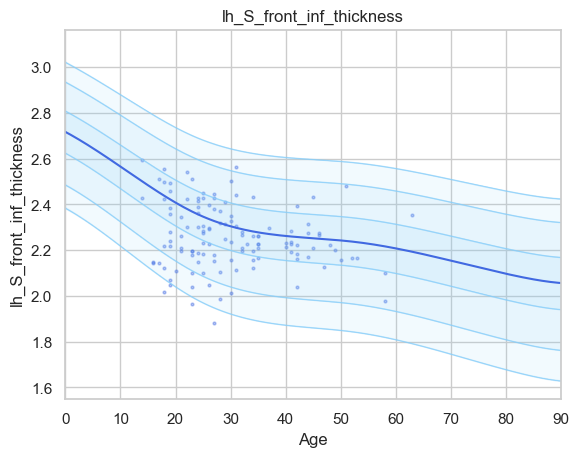

Running IDP 52 lh_S_front_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19519555]), 'Rho': array([0.71913935]), 'pRho': array([2.18050509e-23]), 'SMSE': array([0.5759393]), 'EXPV': array([0.5135898])}


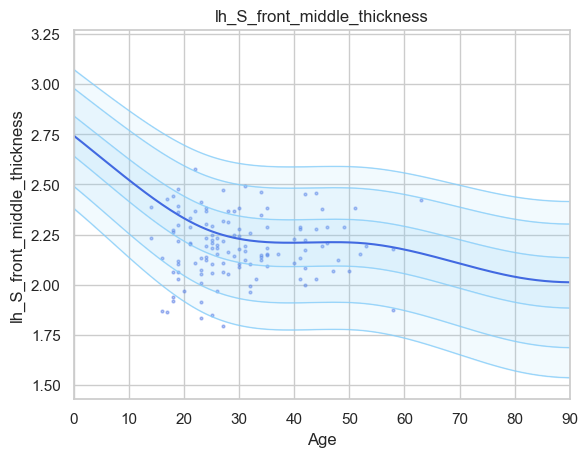

Running IDP 53 lh_S_front_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17062226]), 'Rho': array([0.59618874]), 'pRho': array([4.05102735e-14]), 'SMSE': array([0.82757358]), 'EXPV': array([0.34477777])}


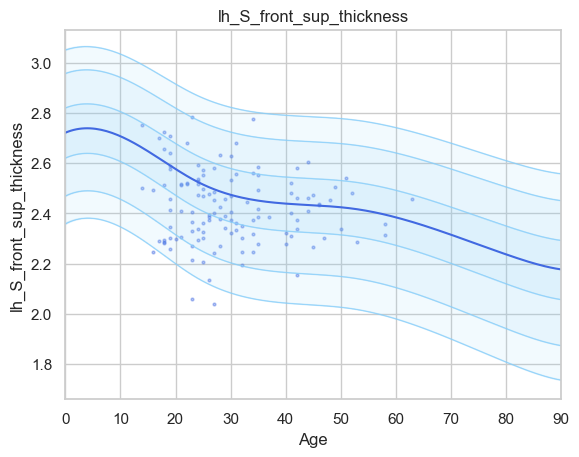

Running IDP 54 lh_S_interm_prim-Jensen_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21336034]), 'Rho': array([0.4941891]), 'pRho': array([2.56175561e-09]), 'SMSE': array([0.83047912]), 'EXPV': array([0.20030254])}


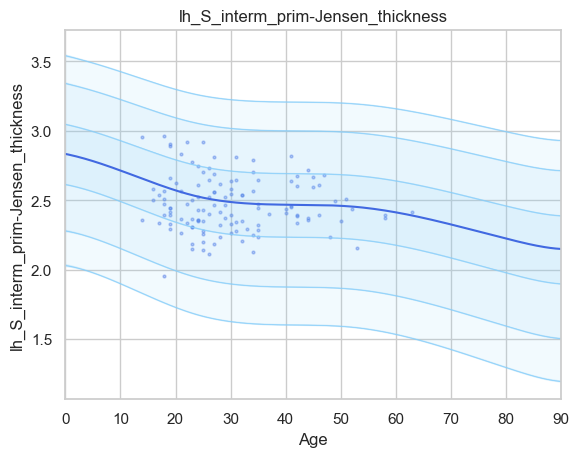

Running IDP 55 lh_S_intrapariet&P_trans_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14566166]), 'Rho': array([0.30516126]), 'pRho': array([0.00052589]), 'SMSE': array([1.28391857]), 'EXPV': array([-0.00916754])}


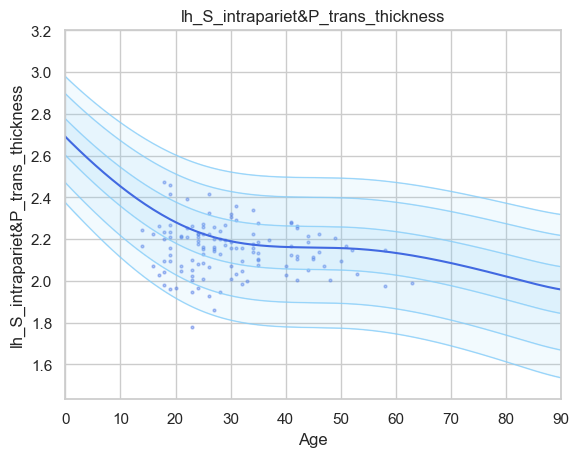

Running IDP 56 lh_S_oc_middle&Lunatus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15029577]), 'Rho': array([0.2683994]), 'pRho': array([0.00247387]), 'SMSE': array([1.09257108]), 'EXPV': array([0.05291968])}


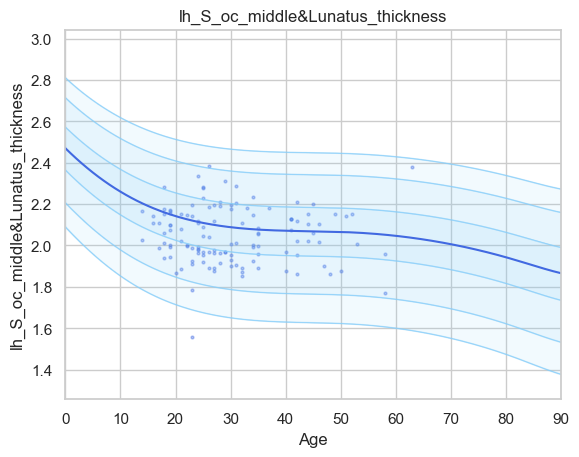

Running IDP 57 lh_S_oc_sup&transversal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.12573884]), 'Rho': array([0.16404928]), 'pRho': array([0.06860736]), 'SMSE': array([1.21243555]), 'EXPV': array([-0.03501199])}


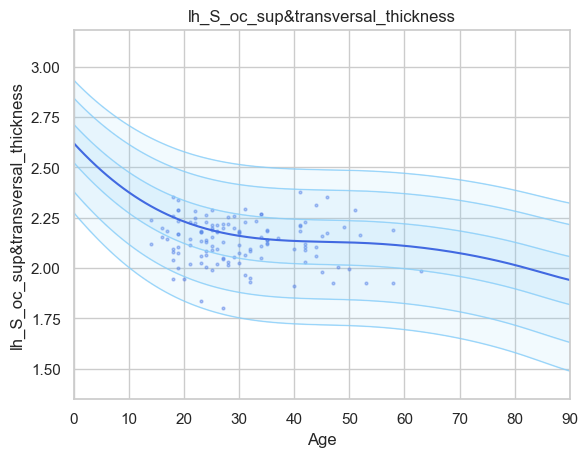

Running IDP 58 lh_S_occipital_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15642727]), 'Rho': array([0.24267552]), 'pRho': array([0.00645422]), 'SMSE': array([1.22910333]), 'EXPV': array([-0.00479557])}


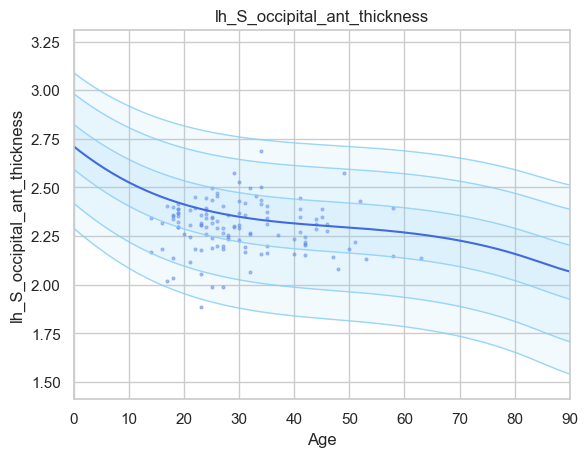

Running IDP 59 lh_S_oc-temp_lat_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1774668]), 'Rho': array([0.07086759]), 'pRho': array([0.43488928]), 'SMSE': array([1.26804852]), 'EXPV': array([-0.21898481])}


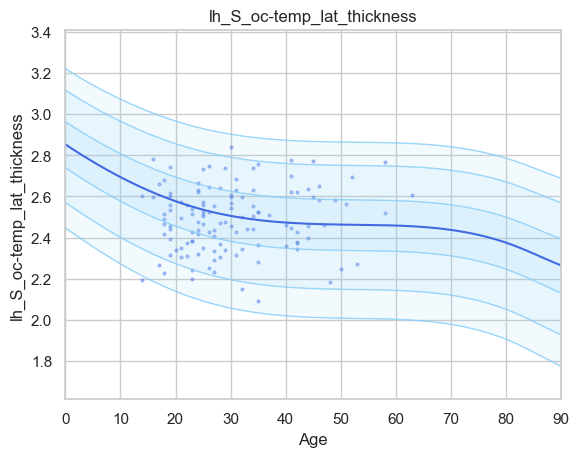

Running IDP 60 lh_S_oc-temp_med&Lingual_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19259808]), 'Rho': array([0.27617658]), 'pRho': array([0.00181515]), 'SMSE': array([1.38902633]), 'EXPV': array([0.06974414])}


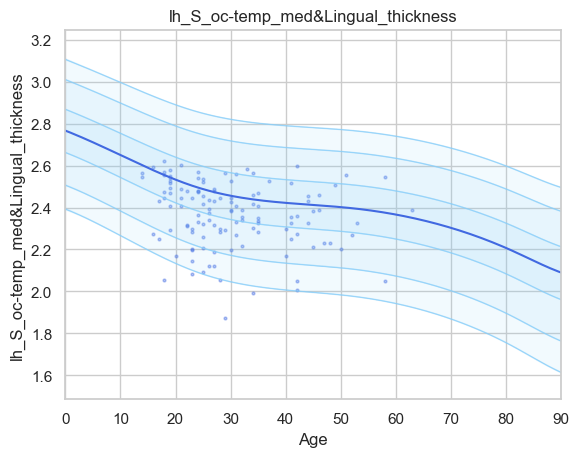

Running IDP 61 lh_S_orbital_lateral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20444805]), 'Rho': array([0.75501276]), 'pRho': array([2.49135529e-27]), 'SMSE': array([0.46576395]), 'EXPV': array([0.55431269])}


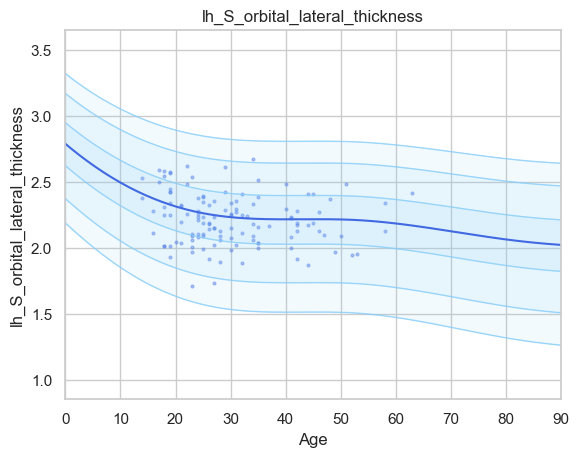

Running IDP 62 lh_S_orbital_med-olfact_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14784497]), 'Rho': array([0.42161146]), 'pRho': array([7.56945872e-07]), 'SMSE': array([0.82991025]), 'EXPV': array([0.17027172])}


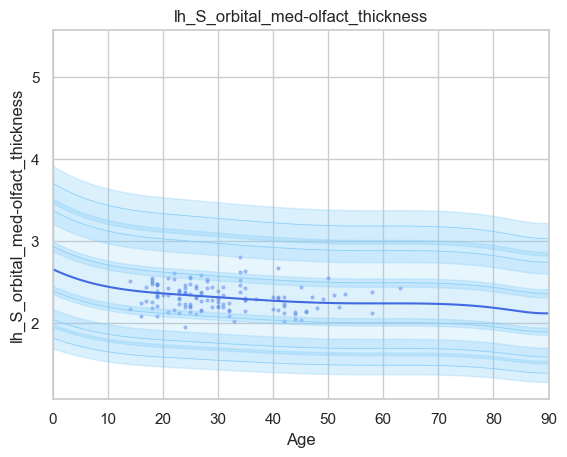

Running IDP 63 lh_S_orbital-H_Shaped_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17758037]), 'Rho': array([0.58390074]), 'pRho': array([1.95304572e-13]), 'SMSE': array([1.03144212]), 'EXPV': array([0.33149401])}


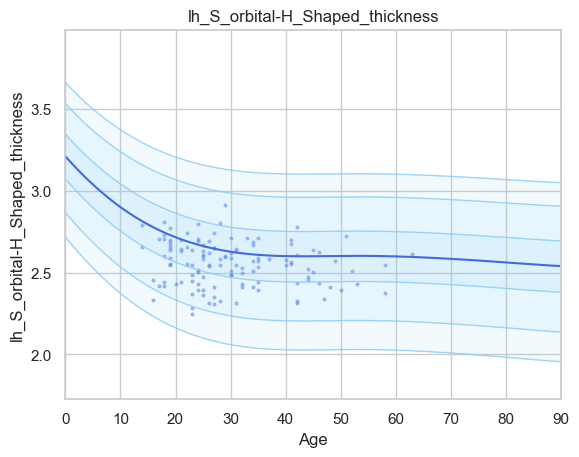

Running IDP 64 lh_S_parieto_occipital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13612847]), 'Rho': array([0.24752951]), 'pRho': array([0.00542631]), 'SMSE': array([1.25854288]), 'EXPV': array([-0.02682132])}


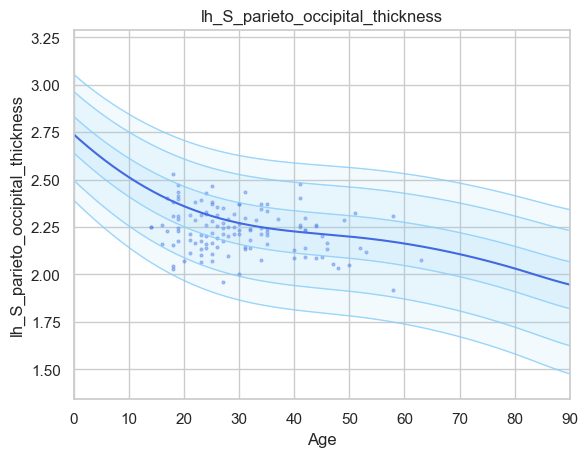

Running IDP 65 lh_S_pericallosal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19940201]), 'Rho': array([0.6109229]), 'pRho': array([5.5261647e-15]), 'SMSE': array([0.6786296]), 'EXPV': array([0.34681715])}


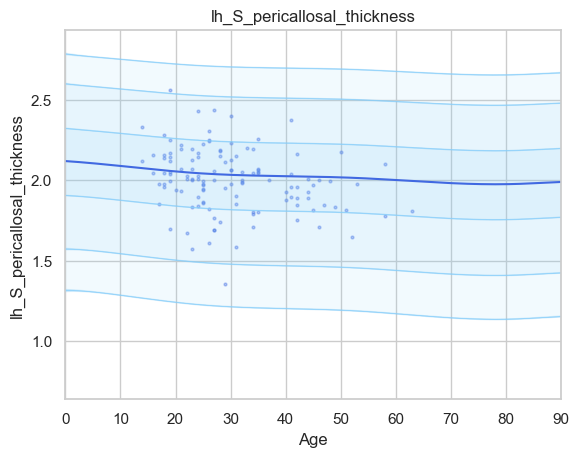

Running IDP 66 lh_S_postcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15112532]), 'Rho': array([0.46357339]), 'pRho': array([3.38256354e-08]), 'SMSE': array([1.04636559]), 'EXPV': array([0.12739637])}


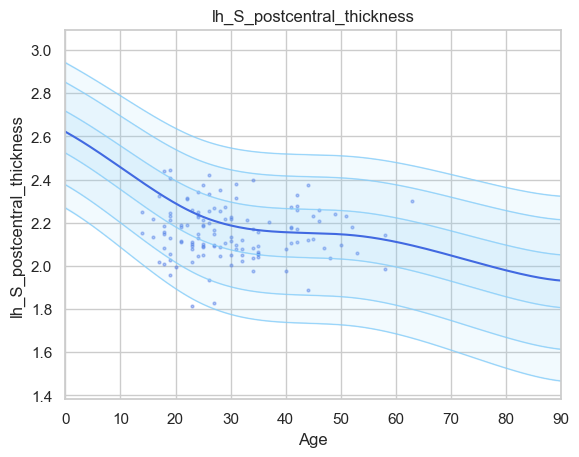

Running IDP 67 lh_S_precentral-inf-part_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16394675]), 'Rho': array([0.64043726]), 'pRho': array([6.93922874e-17]), 'SMSE': array([0.83844794]), 'EXPV': array([0.38737053])}


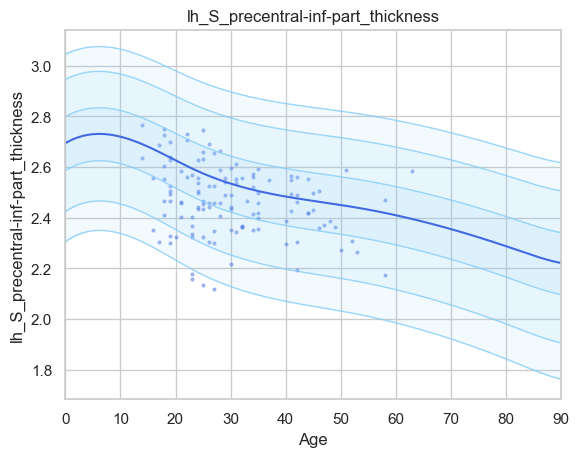

Running IDP 68 lh_S_precentral-sup-part_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16223497]), 'Rho': array([0.41439829]), 'pRho': array([1.23456579e-06]), 'SMSE': array([1.14541009]), 'EXPV': array([0.09908734])}


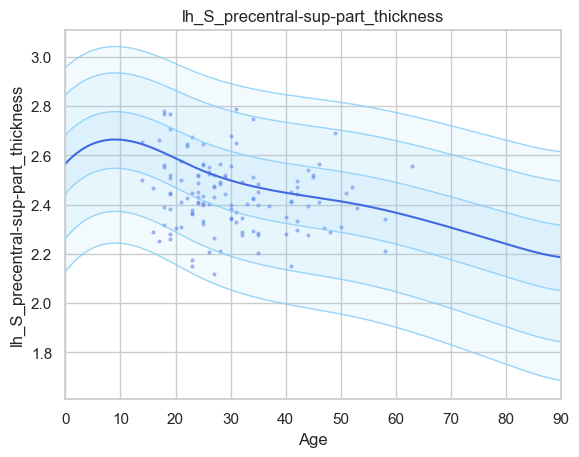

Running IDP 69 lh_S_suborbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22855019]), 'Rho': array([0.43024243]), 'pRho': array([4.14586152e-07]), 'SMSE': array([0.99939751]), 'EXPV': array([0.09979163])}


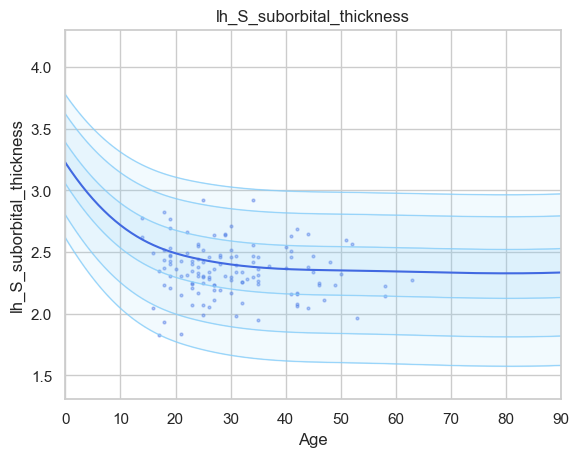

Running IDP 70 lh_S_subparietal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15693134]), 'Rho': array([0.230853]), 'pRho': array([0.00970988]), 'SMSE': array([1.19597847]), 'EXPV': array([-0.09267779])}


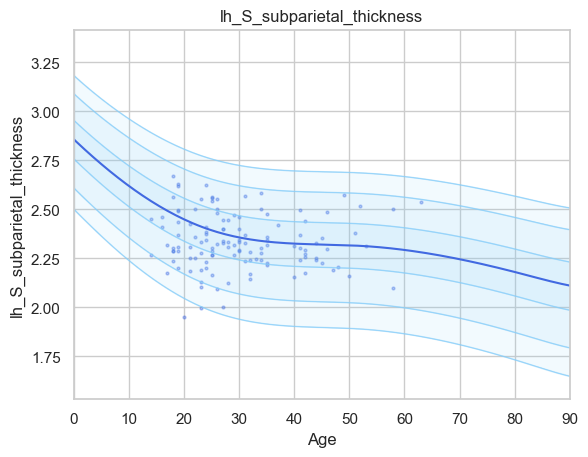

Running IDP 71 lh_S_temporal_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14756307]), 'Rho': array([0.48410551]), 'pRho': array([6.18567754e-09]), 'SMSE': array([0.84187437]), 'EXPV': array([0.16851109])}


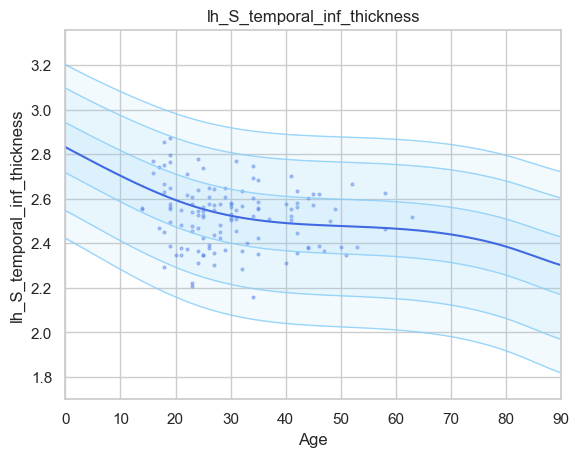

Running IDP 72 lh_S_temporal_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15225646]), 'Rho': array([0.50407453]), 'pRho': array([1.04559e-09]), 'SMSE': array([1.01356246]), 'EXPV': array([0.14566776])}


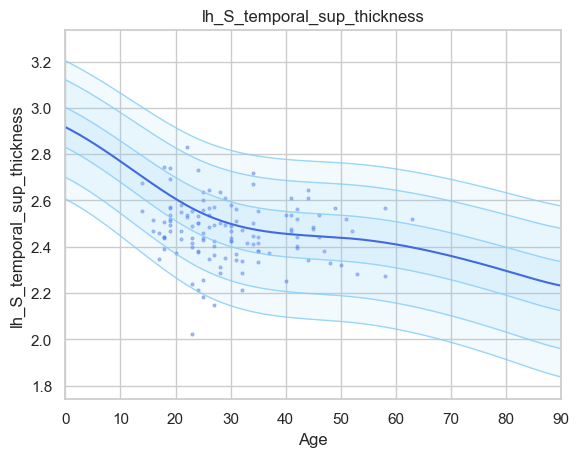

Running IDP 73 lh_S_temporal_transverse_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19803227]), 'Rho': array([0.25143148]), 'pRho': array([0.00470828]), 'SMSE': array([1.05670656]), 'EXPV': array([0.04721934])}


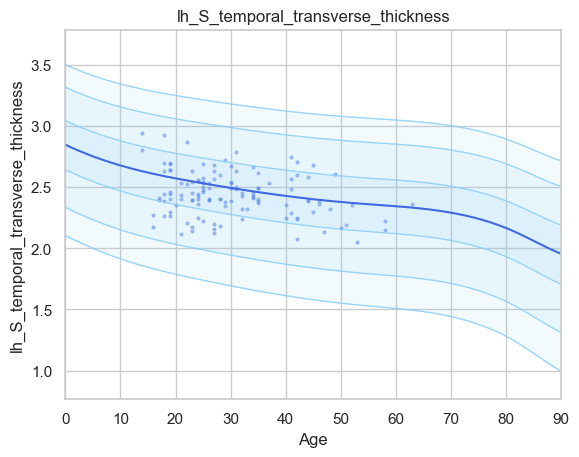

Running IDP 74 rh_G&S_frontomargin_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21710835]), 'Rho': array([0.94193373]), 'pRho': array([4.95158233e-83]), 'SMSE': array([0.18241773]), 'EXPV': array([0.8861149])}


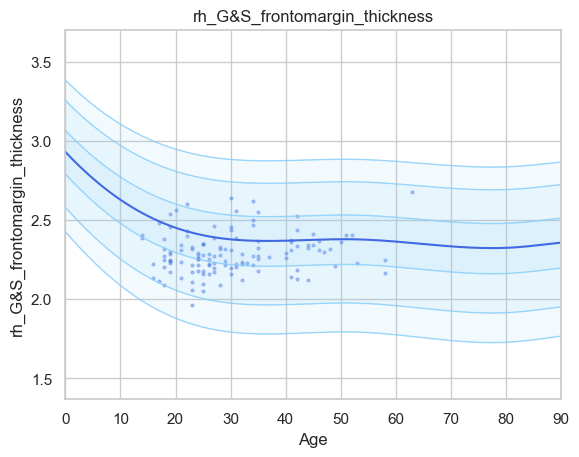

Running IDP 75 rh_G&S_occipital_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16608592]), 'Rho': array([0.00537415]), 'pRho': array([0.95285955]), 'SMSE': array([1.14411709]), 'EXPV': array([-0.08015087])}


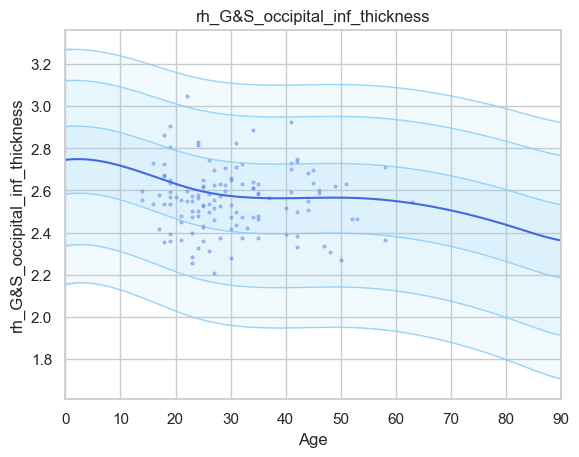

Running IDP 76 rh_G&S_paracentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15973062]), 'Rho': array([0.2371566]), 'pRho': array([0.00782916]), 'SMSE': array([1.21122608]), 'EXPV': array([-0.01397523])}


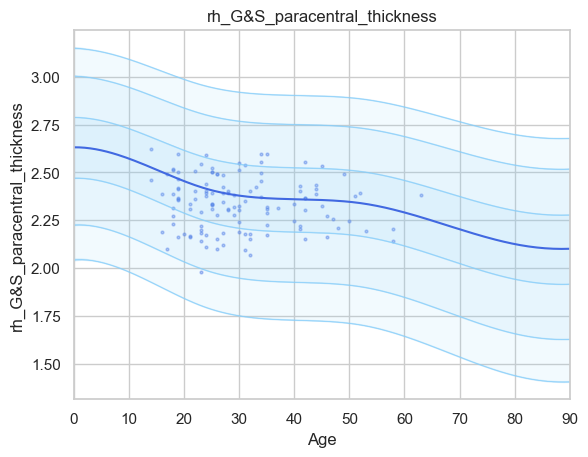

Running IDP 77 rh_G&S_subcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1577157]), 'Rho': array([0.37530535]), 'pRho': array([1.42207721e-05]), 'SMSE': array([0.92523339]), 'EXPV': array([0.09583632])}


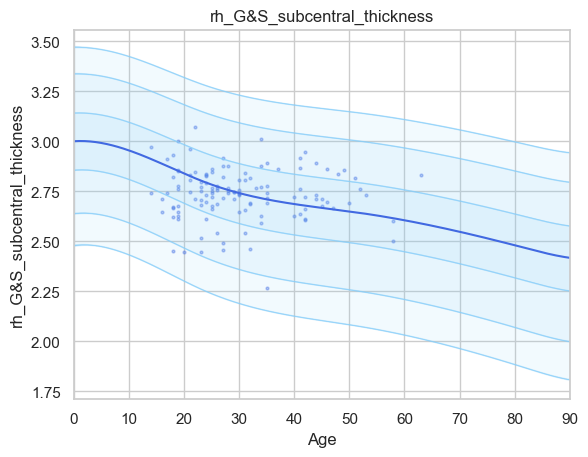

Running IDP 78 rh_G&S_transv_frontopol_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21076944]), 'Rho': array([0.94653059]), 'pRho': array([5.31079838e-87]), 'SMSE': array([0.12528136]), 'EXPV': array([0.89575624])}


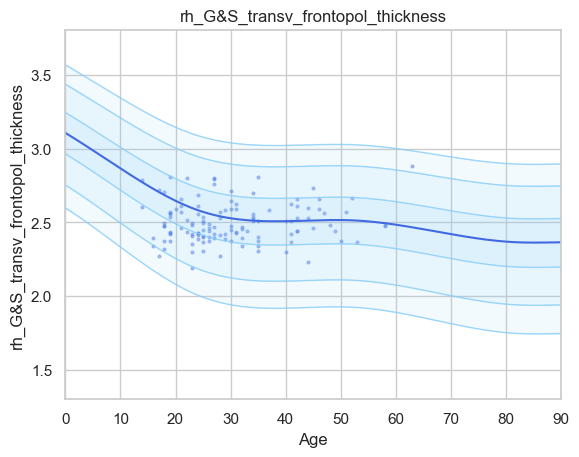

Running IDP 79 rh_G&S_cingul-Ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.24536841]), 'Rho': array([0.69749705]), 'pRho': array([2.38910481e-21]), 'SMSE': array([0.63376467]), 'EXPV': array([0.4854892])}


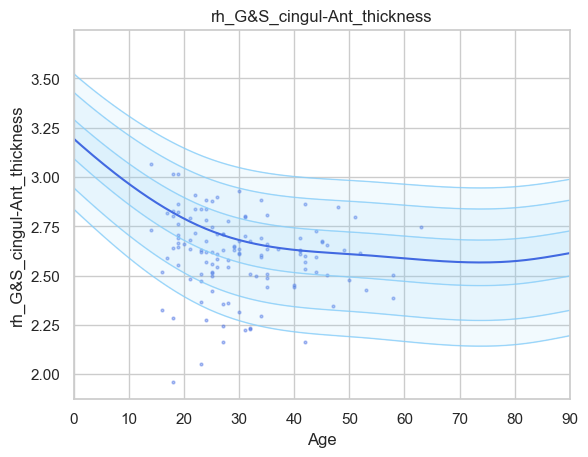

Running IDP 80 rh_G&S_cingul-Mid-Ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18997258]), 'Rho': array([0.63388679]), 'pRho': array([1.92346667e-16]), 'SMSE': array([0.89301463]), 'EXPV': array([0.38945828])}


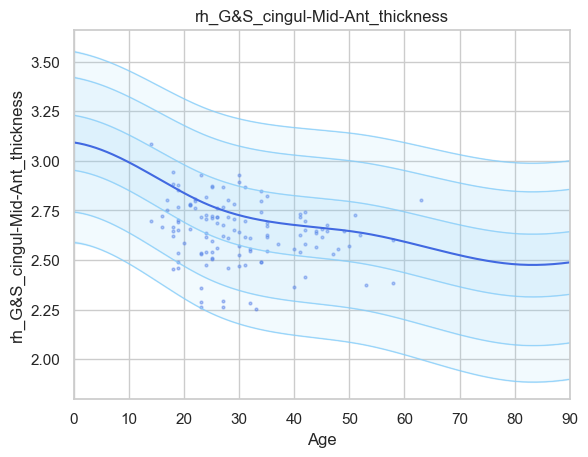

Running IDP 81 rh_G&S_cingul-Mid-Post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14504111]), 'Rho': array([0.40844755]), 'pRho': array([1.83121111e-06]), 'SMSE': array([1.23397635]), 'EXPV': array([-0.05288377])}


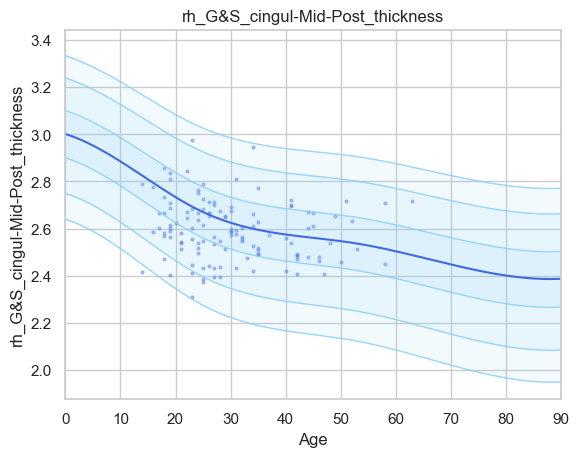

Running IDP 82 rh_G_cingul-Post-dorsal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16876556]), 'Rho': array([0.07463059]), 'pRho': array([0.4108119]), 'SMSE': array([1.26234384]), 'EXPV': array([-0.25368922])}


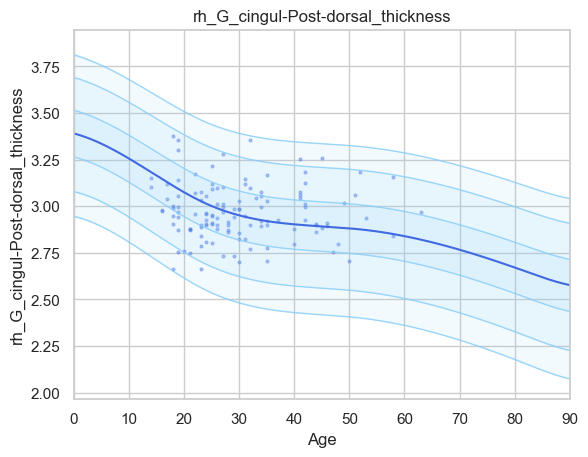

Running IDP 83 rh_G_cingul-Post-ventral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21697104]), 'Rho': array([0.25747928]), 'pRho': array([0.0037618]), 'SMSE': array([1.01726364]), 'EXPV': array([0.05587399])}


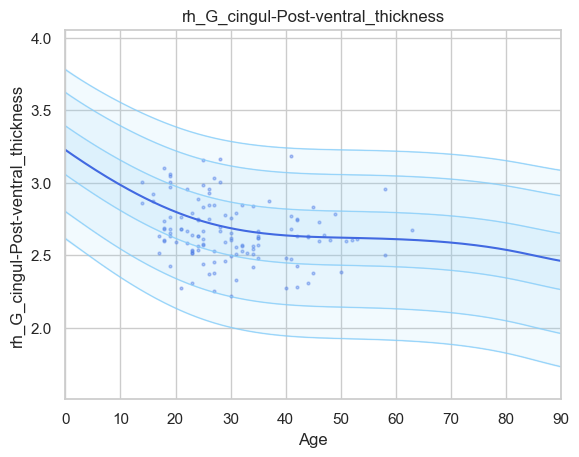

Running IDP 84 rh_G_cuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13725206]), 'Rho': array([0.13836747]), 'pRho': array([0.12555482]), 'SMSE': array([1.15800516]), 'EXPV': array([-0.0746551])}


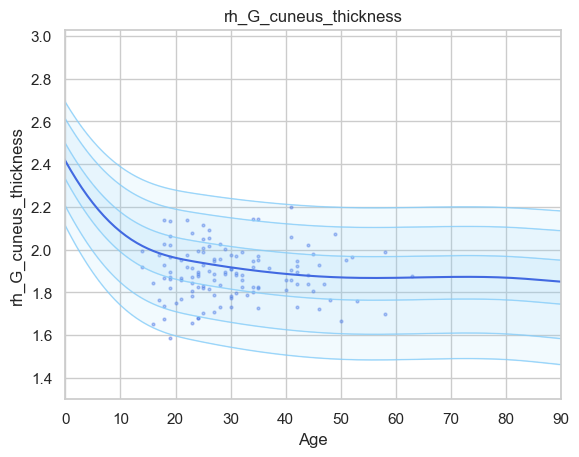

Running IDP 85 rh_G_front_inf-Opercular_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15487614]), 'Rho': array([0.61905324]), 'pRho': array([1.7462389e-15]), 'SMSE': array([0.85641137]), 'EXPV': array([0.37076191])}


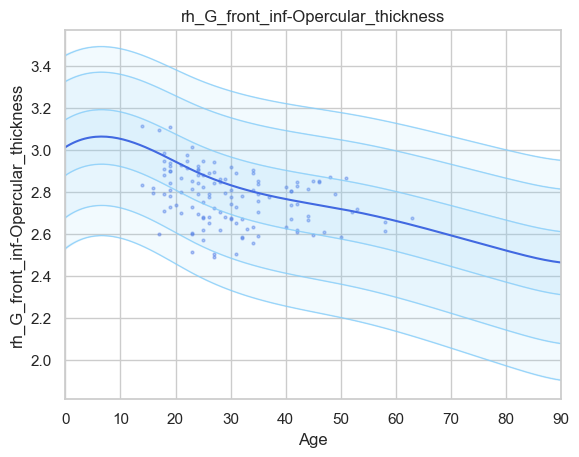

Running IDP 86 rh_G_front_inf-Orbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.25797699]), 'Rho': array([0.65731798]), 'pRho': array([4.36540246e-18]), 'SMSE': array([0.65125555]), 'EXPV': array([0.43177285])}


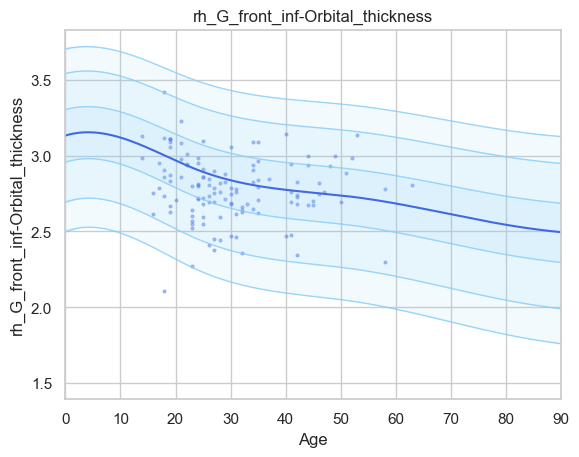

Running IDP 87 rh_G_front_inf-Triangul_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18523702]), 'Rho': array([0.73269327]), 'pRho': array([8.70022884e-25]), 'SMSE': array([0.57096163]), 'EXPV': array([0.51187453])}


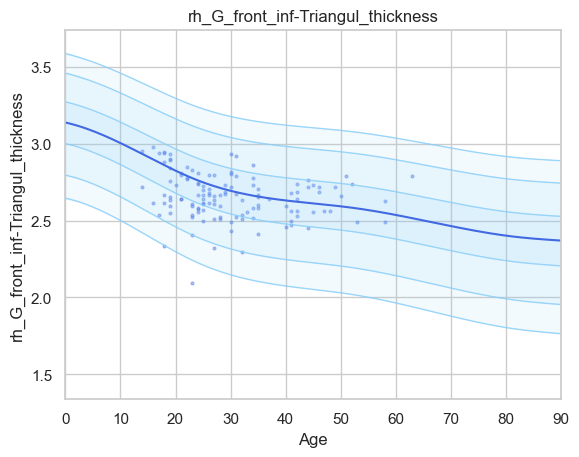

Running IDP 88 rh_G_front_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18997434]), 'Rho': array([0.83904723]), 'pRho': array([6.26139856e-41]), 'SMSE': array([0.38652821]), 'EXPV': array([0.69948778])}


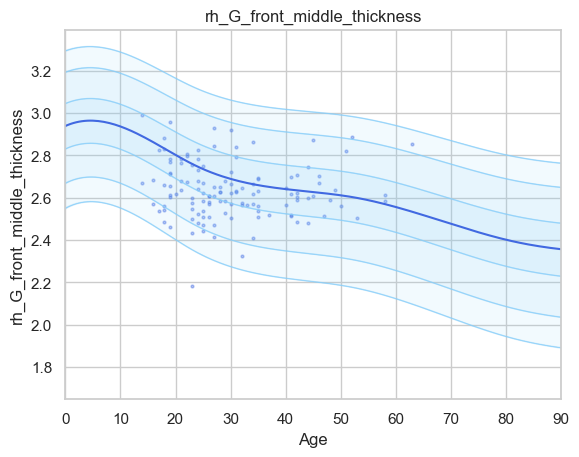

Running IDP 89 rh_G_front_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20167173]), 'Rho': array([0.77790421]), 'pRho': array([2.62521189e-30]), 'SMSE': array([0.55618695]), 'EXPV': array([0.59164213])}


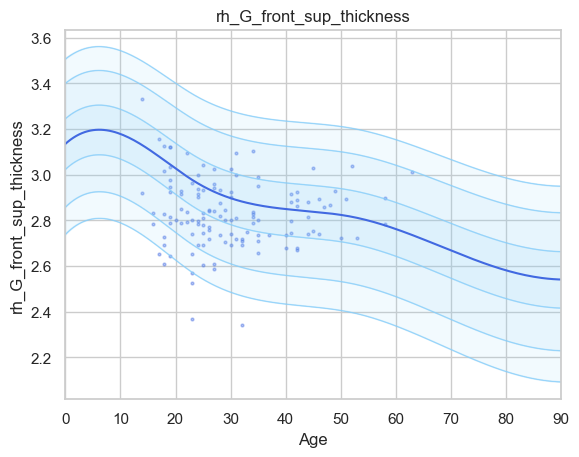

Running IDP 90 rh_G_Ins_lg&S_cent_ins_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.37267475]), 'Rho': array([0.31331413]), 'pRho': array([0.00036195]), 'SMSE': array([0.91823437]), 'EXPV': array([0.09091208])}


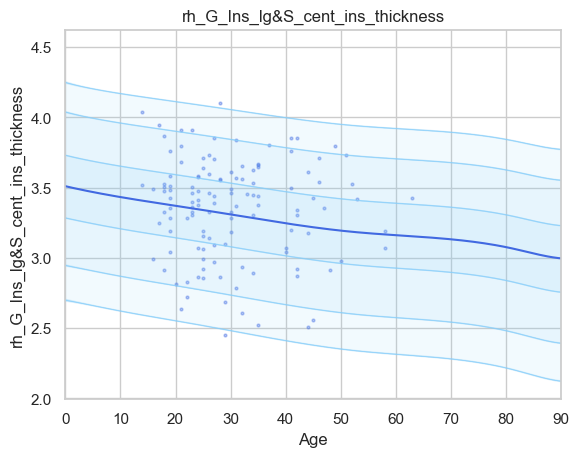

Running IDP 91 rh_G_insular_short_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.33464383]), 'Rho': array([0.0148383]), 'pRho': array([0.87033476]), 'SMSE': array([1.03942893]), 'EXPV': array([-0.03344793])}


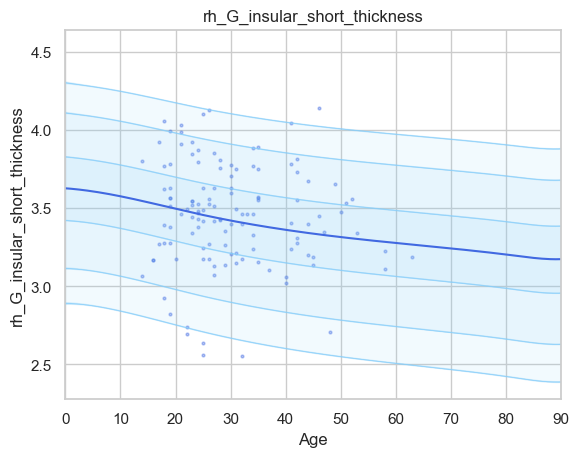

Running IDP 92 rh_G_occipital_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13212406]), 'Rho': array([0.22937463]), 'pRho': array([0.01020449]), 'SMSE': array([1.23466309]), 'EXPV': array([0.02771208])}


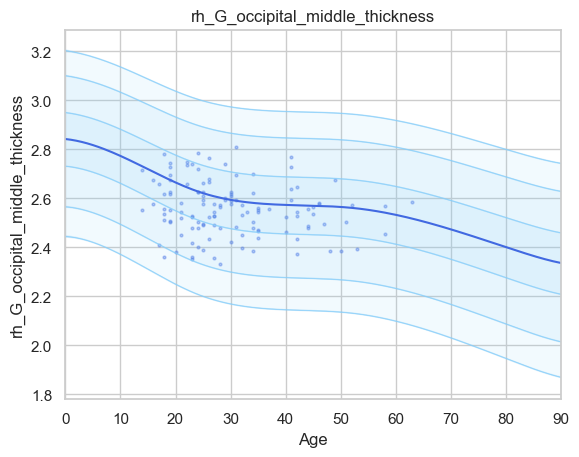

Running IDP 93 rh_G_occipital_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14440523]), 'Rho': array([0.18666264]), 'pRho': array([0.0377418]), 'SMSE': array([1.11756788]), 'EXPV': array([0.0157853])}


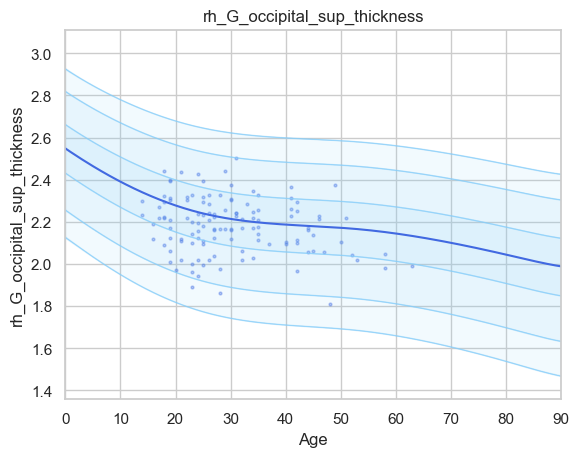

Running IDP 94 rh_G_oc-temp_lat-fusifor_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15835451]), 'Rho': array([0.21826028]), 'pRho': array([0.01468259]), 'SMSE': array([1.12291915]), 'EXPV': array([0.04416502])}


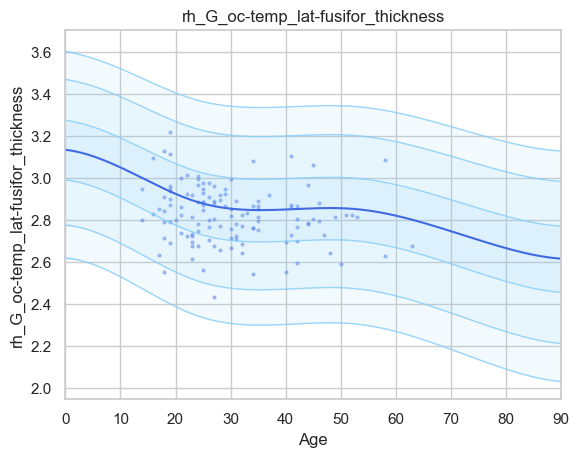

Running IDP 95 rh_G_oc-temp_med-Lingual_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1508597]), 'Rho': array([0.32293909]), 'pRho': array([0.00022945]), 'SMSE': array([1.19487039]), 'EXPV': array([-0.19238642])}


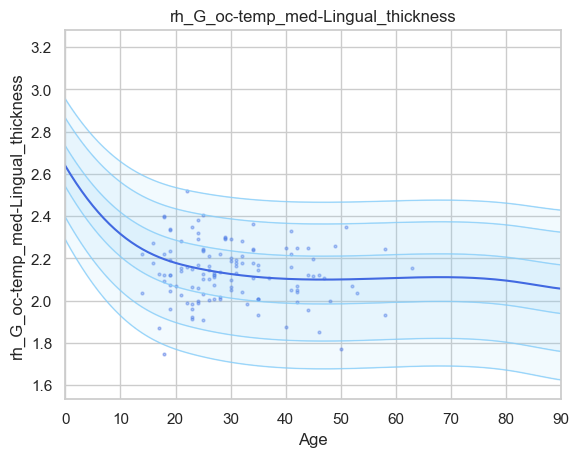

Running IDP 96 rh_G_oc-temp_med-Parahip_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19350444]), 'Rho': array([0.55306112]), 'pRho': array([7.35473775e-12]), 'SMSE': array([0.74472585]), 'EXPV': array([0.30461609])}


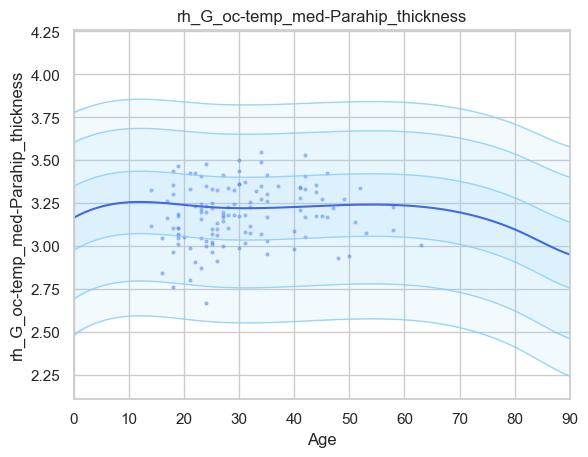

Running IDP 97 rh_G_orbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18824197]), 'Rho': array([0.86592805]), 'pRho': array([1.56865997e-47]), 'SMSE': array([0.34652142]), 'EXPV': array([0.74962545])}


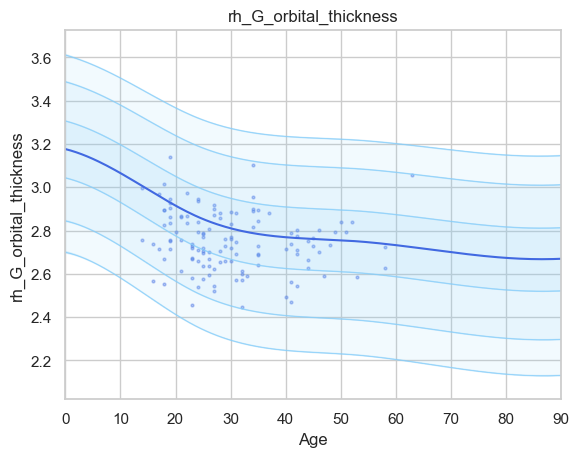

Running IDP 98 rh_G_pariet_inf-Angular_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16029652]), 'Rho': array([0.01760365]), 'pRho': array([0.84644203]), 'SMSE': array([1.47653702]), 'EXPV': array([-0.35129512])}


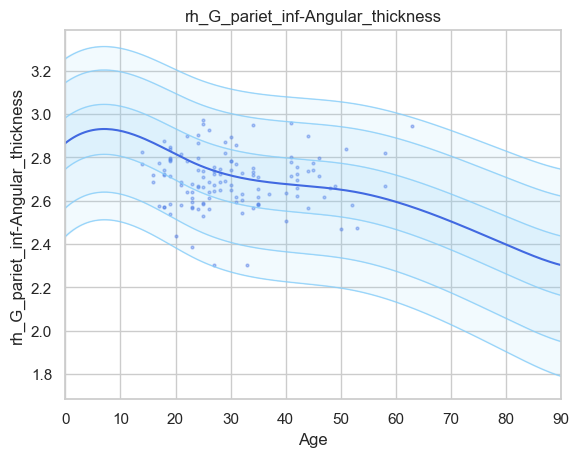

Running IDP 99 rh_G_pariet_inf-Supramar_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15684339]), 'Rho': array([0.45808643]), 'pRho': array([5.21689233e-08]), 'SMSE': array([0.9996252]), 'EXPV': array([0.02743663])}


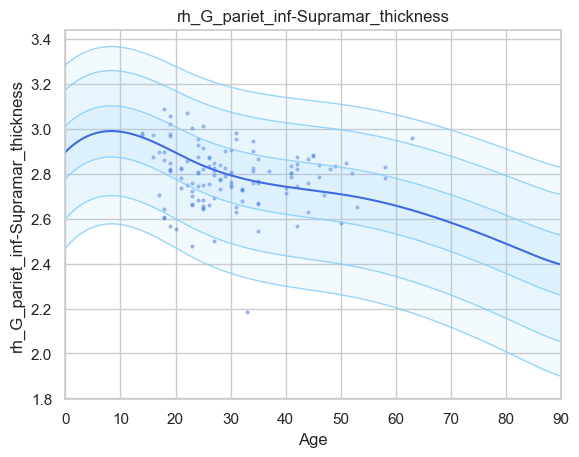

Running IDP 100 rh_G_parietal_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14170308]), 'Rho': array([0.16358371]), 'pRho': array([0.06941116]), 'SMSE': array([1.51929084]), 'EXPV': array([-0.18513702])}


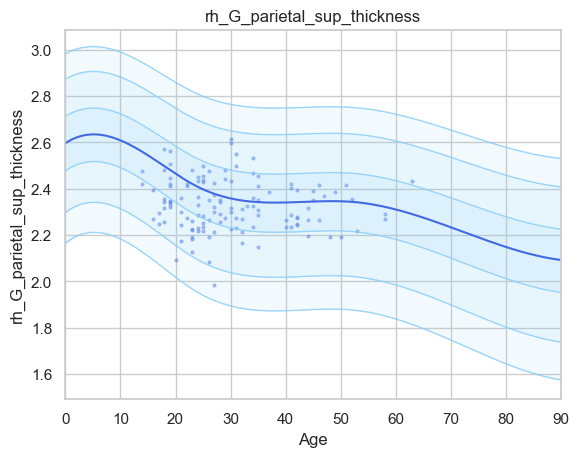

Running IDP 101 rh_G_postcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1634885]), 'Rho': array([0.25552351]), 'pRho': array([0.00404736]), 'SMSE': array([1.27593514]), 'EXPV': array([-0.03629078])}


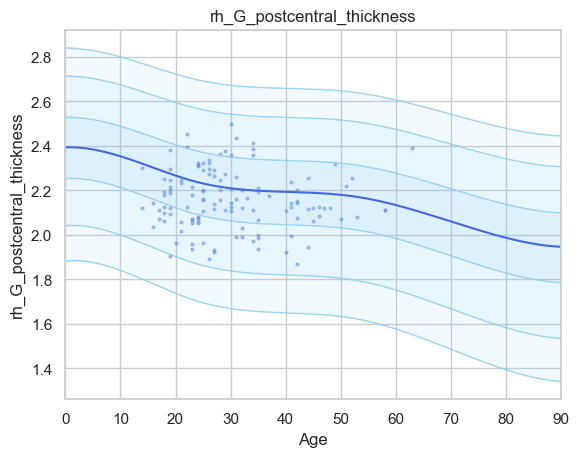

Running IDP 102 rh_G_precentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14550754]), 'Rho': array([0.27914365]), 'pRho': array([0.00160892]), 'SMSE': array([1.07795275]), 'EXPV': array([0.0074166])}


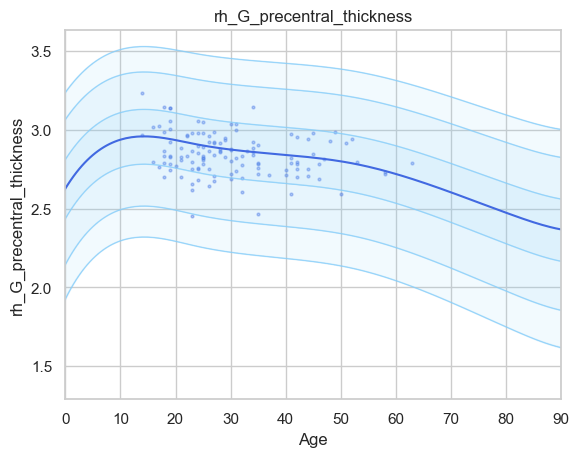

Running IDP 103 rh_G_precuneus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14175309]), 'Rho': array([0.13589198]), 'pRho': array([0.13255138]), 'SMSE': array([1.45253664]), 'EXPV': array([-0.1983646])}


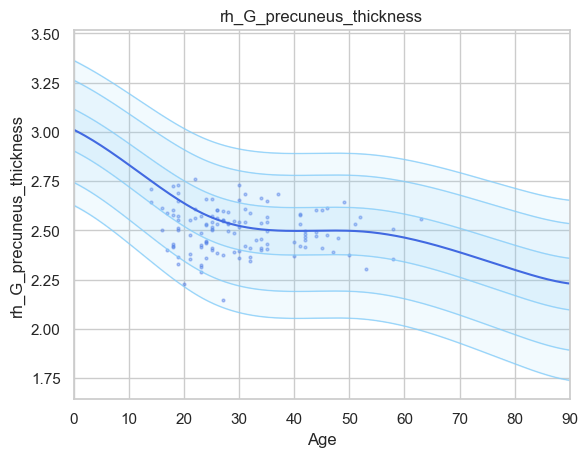

Running IDP 104 rh_G_rectus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21548833]), 'Rho': array([0.64308312]), 'pRho': array([4.5590095e-17]), 'SMSE': array([0.83218994]), 'EXPV': array([0.40056895])}


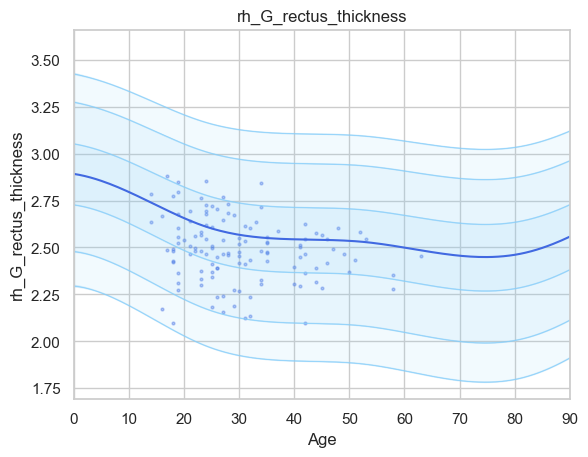

Running IDP 105 rh_G_subcallosal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.3293232]), 'Rho': array([0.13647335]), 'pRho': array([0.13088213]), 'SMSE': array([0.98835284]), 'EXPV': array([0.01852851])}


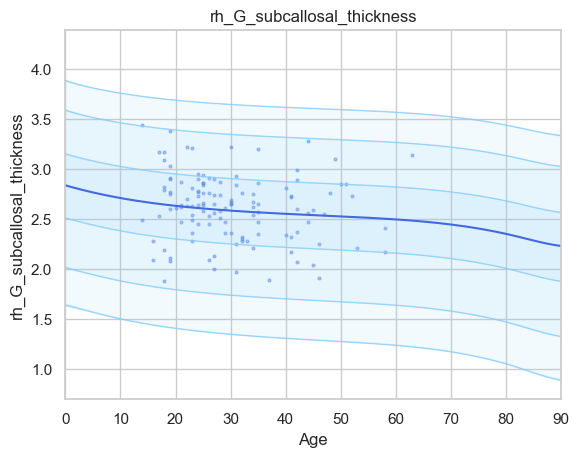

Running IDP 106 rh_G_temp_sup-G_T_transv_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22881917]), 'Rho': array([0.07446192]), 'pRho': array([0.41187417]), 'SMSE': array([1.32279743]), 'EXPV': array([-0.17563659])}


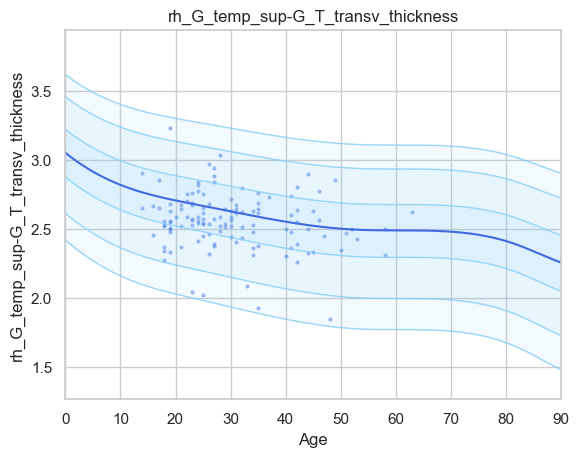

Running IDP 107 rh_G_temp_sup-Lateral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20623945]), 'Rho': array([0.68868873]), 'pRho': array([1.40407636e-20]), 'SMSE': array([0.8269423]), 'EXPV': array([0.45052278])}


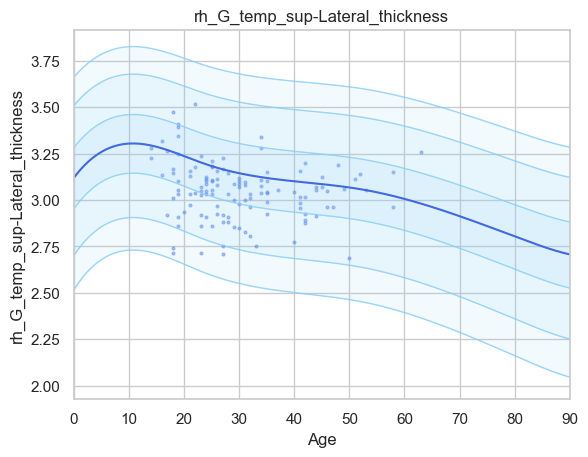

Running IDP 108 rh_G_temp_sup-Plan_polar_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.24288057]), 'Rho': array([0.22302707]), 'pRho': array([0.01258744]), 'SMSE': array([0.98287542]), 'EXPV': array([0.0256958])}


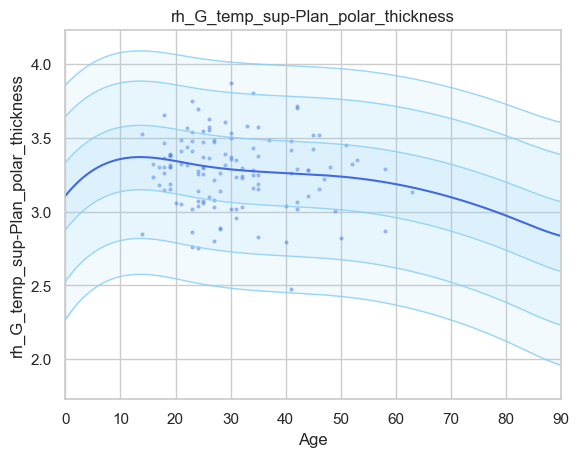

Running IDP 109 rh_G_temp_sup-Plan_tempo_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18150902]), 'Rho': array([0.42527922]), 'pRho': array([5.87404749e-07]), 'SMSE': array([1.06183044]), 'EXPV': array([0.08748941])}


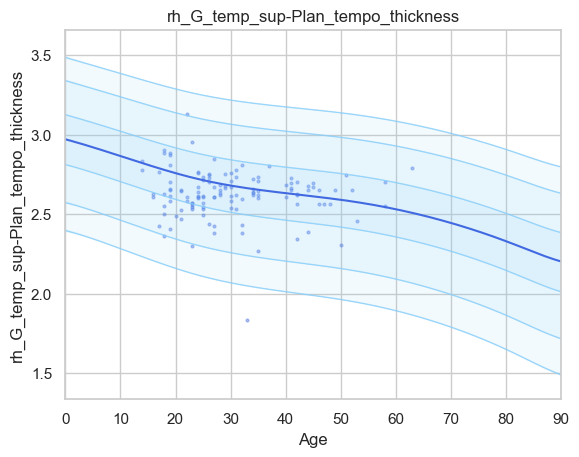

Running IDP 110 rh_G_temporal_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16686342]), 'Rho': array([0.35043953]), 'pRho': array([5.68804701e-05]), 'SMSE': array([1.11821332]), 'EXPV': array([0.10552924])}


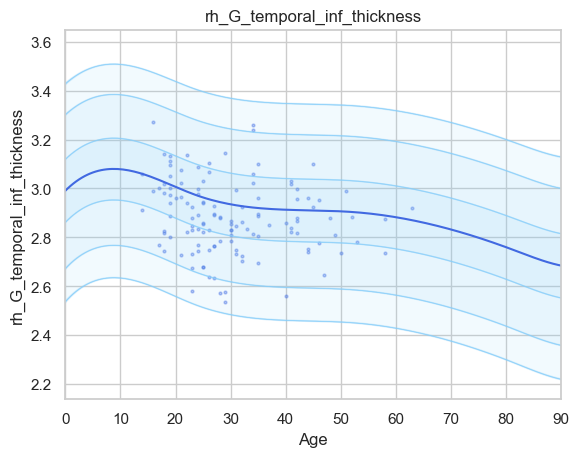

Running IDP 111 rh_G_temporal_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.2190316]), 'Rho': array([0.57971107]), 'pRho': array([3.28172479e-13]), 'SMSE': array([0.78037115]), 'EXPV': array([0.31459087])}


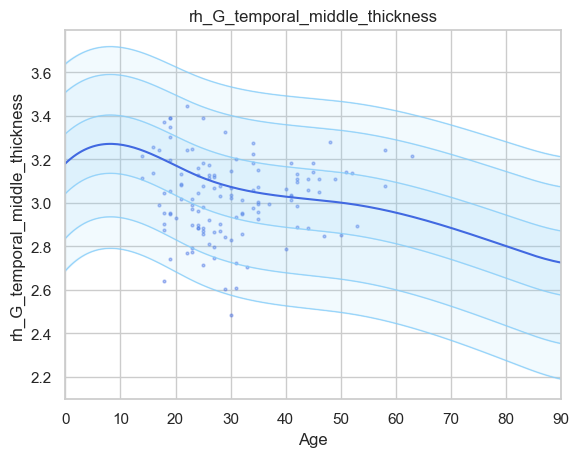

Running IDP 112 rh_Lat_Fis-ant-Horizont_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.24503282]), 'Rho': array([0.66731633]), 'pRho': array([7.66539765e-19]), 'SMSE': array([0.70137303]), 'EXPV': array([0.44236306])}


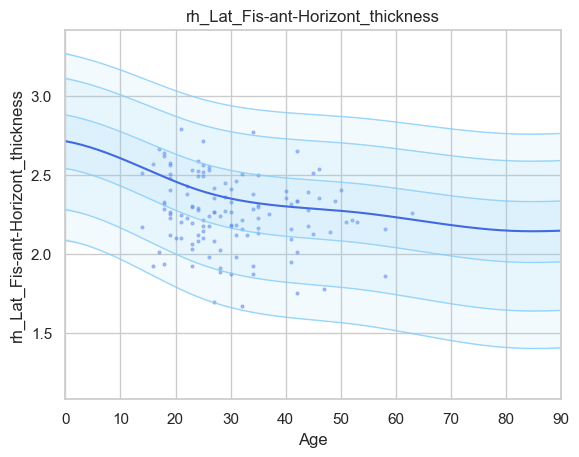

Running IDP 113 rh_Lat_Fis-ant-Vertical_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.26425753]), 'Rho': array([0.54691717]), 'pRho': array([1.44127688e-11]), 'SMSE': array([0.86346604]), 'EXPV': array([0.28691931])}


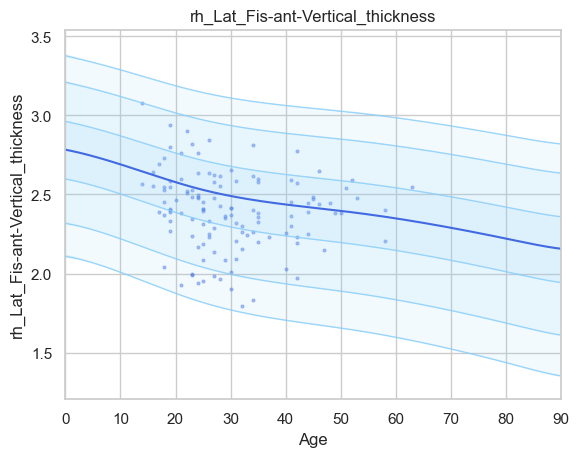

Running IDP 114 rh_Lat_Fis-post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22372877]), 'Rho': array([-0.04769592]), 'pRho': array([0.599546]), 'SMSE': array([1.43988931]), 'EXPV': array([-0.36332455])}


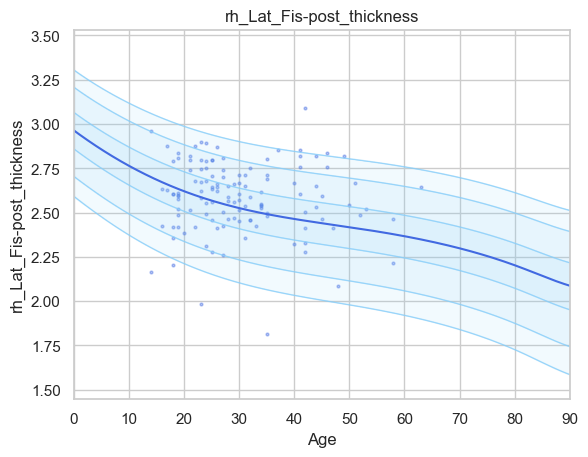

Running IDP 115 rh_Pole_occipital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16931966]), 'Rho': array([0.29383272]), 'pRho': array([0.00086747]), 'SMSE': array([1.49155293]), 'EXPV': array([0.08447864])}


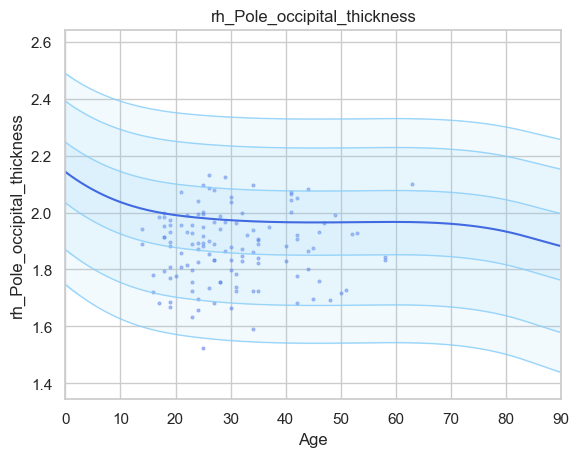

Running IDP 116 rh_Pole_temporal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22233193]), 'Rho': array([0.32144487]), 'pRho': array([0.00024653]), 'SMSE': array([0.94933475]), 'EXPV': array([0.10052899])}


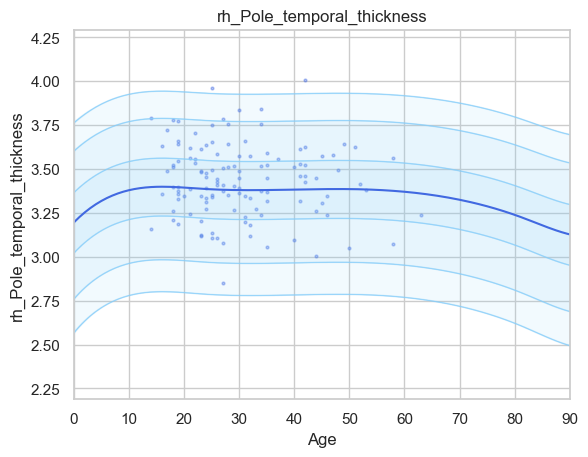

Running IDP 117 rh_S_calcarine_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15894354]), 'Rho': array([0.43020775]), 'pRho': array([4.15605437e-07]), 'SMSE': array([1.15404745]), 'EXPV': array([-0.15193426])}


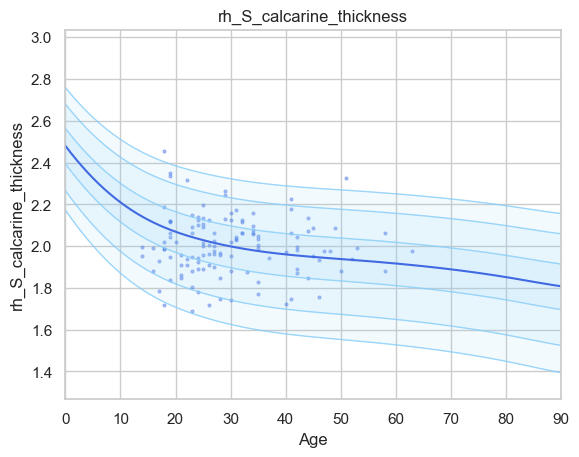

Running IDP 118 rh_S_central_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14055302]), 'Rho': array([0.20889301]), 'pRho': array([0.01969284]), 'SMSE': array([1.3568491]), 'EXPV': array([0.00958611])}


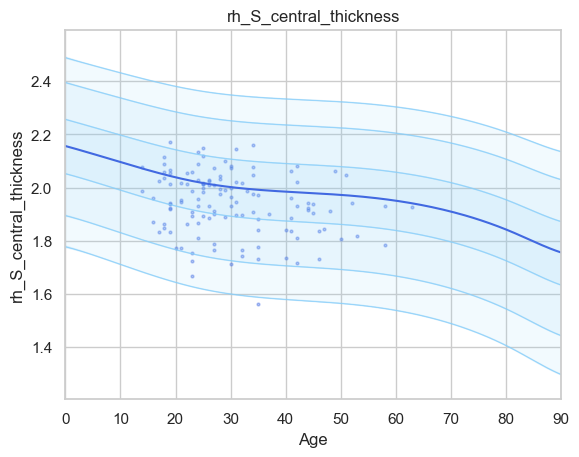

Running IDP 119 rh_S_cingul-Marginalis_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16131521]), 'Rho': array([0.22263801]), 'pRho': array([0.0127481]), 'SMSE': array([1.64318467]), 'EXPV': array([-0.29024136])}


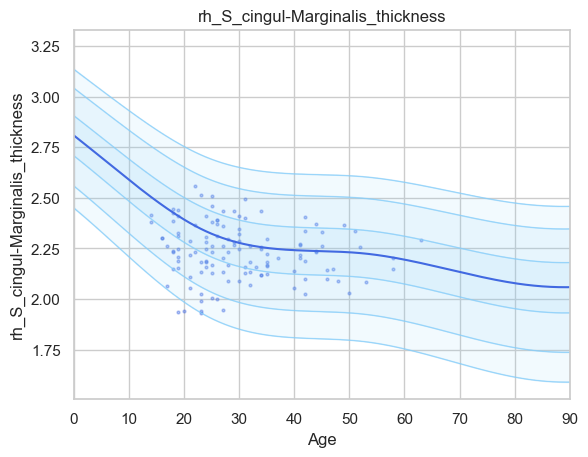

Running IDP 120 rh_S_circular_insula_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20908762]), 'Rho': array([0.46829405]), 'pRho': array([2.31408438e-08]), 'SMSE': array([0.78538176]), 'EXPV': array([0.21616693])}


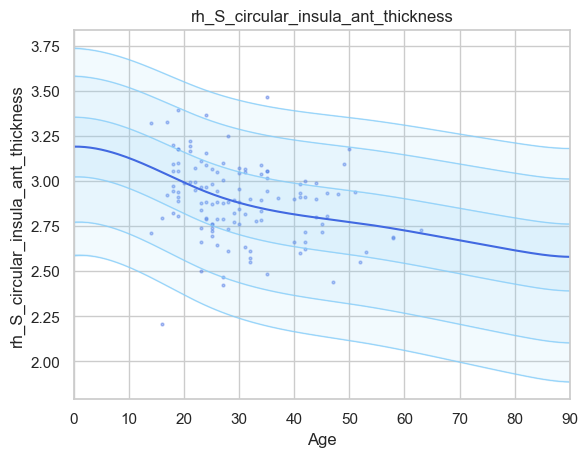

Running IDP 121 rh_S_circular_insula_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.2192953]), 'Rho': array([0.29855044]), 'pRho': array([0.00070609]), 'SMSE': array([0.92837859]), 'EXPV': array([0.08538808])}


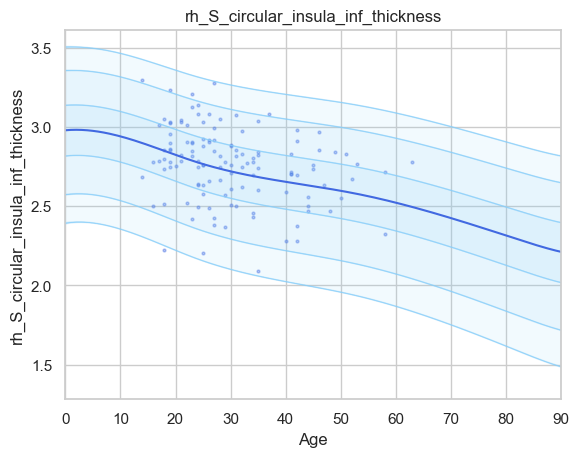

Running IDP 122 rh_S_circular_insula_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19277184]), 'Rho': array([0.14722457]), 'pRho': array([0.10282163]), 'SMSE': array([1.16501146]), 'EXPV': array([-0.07149111])}


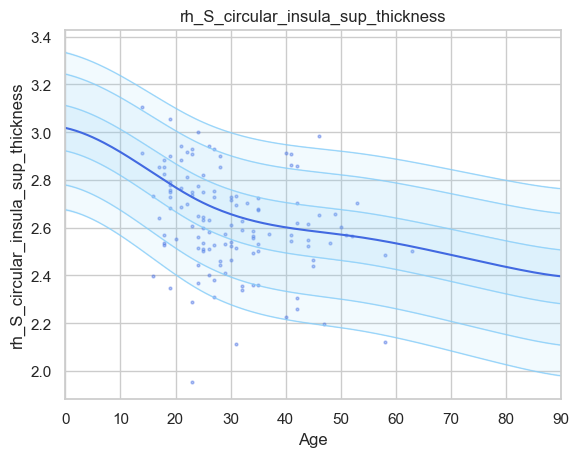

Running IDP 123 rh_S_collat_transv_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1684467]), 'Rho': array([0.45661444]), 'pRho': array([5.85150262e-08]), 'SMSE': array([0.84052868]), 'EXPV': array([0.20459516])}


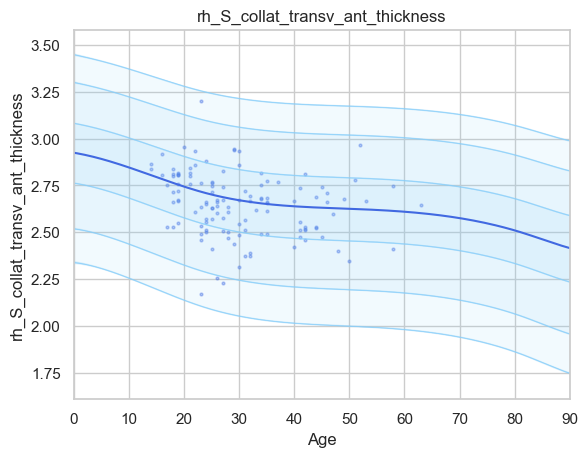

Running IDP 124 rh_S_collat_transv_post_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18018476]), 'Rho': array([0.02013334]), 'pRho': array([0.82470575]), 'SMSE': array([1.22691439]), 'EXPV': array([-0.15715691])}


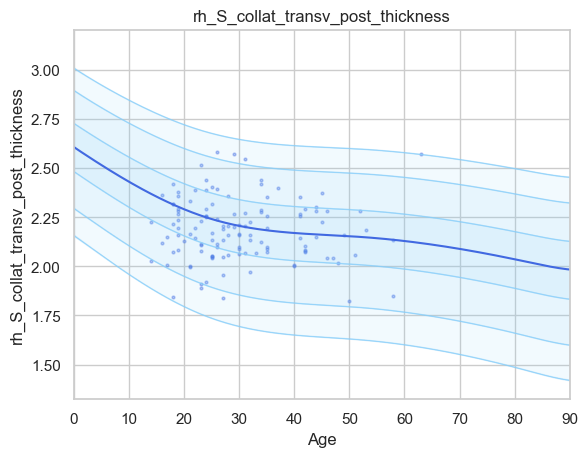

Running IDP 125 rh_S_front_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17752996]), 'Rho': array([0.6941869]), 'pRho': array([4.68991335e-21]), 'SMSE': array([0.68151732]), 'EXPV': array([0.48148599])}


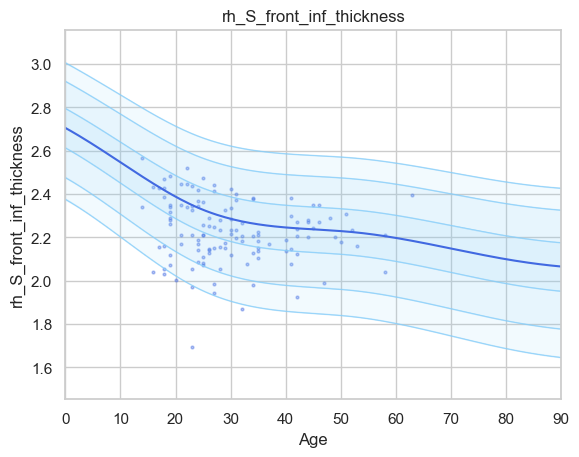

Running IDP 126 rh_S_front_middle_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.20651398]), 'Rho': array([0.85201833]), 'pRho': array([6.49671572e-44]), 'SMSE': array([0.30409721]), 'EXPV': array([0.7248307])}


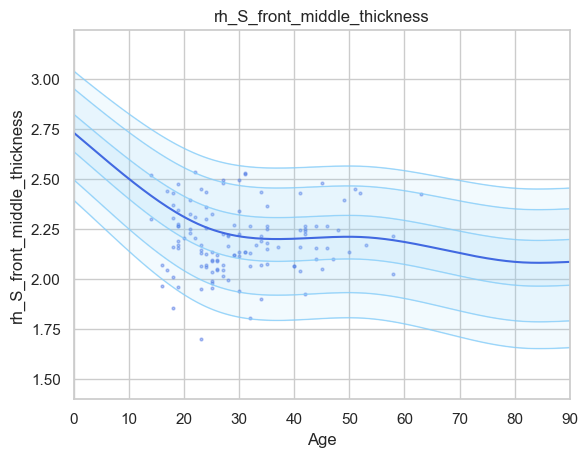

Running IDP 127 rh_S_front_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.18367141]), 'Rho': array([0.65286733]), 'pRho': array([9.23670377e-18]), 'SMSE': array([0.71822515]), 'EXPV': array([0.4258808])}


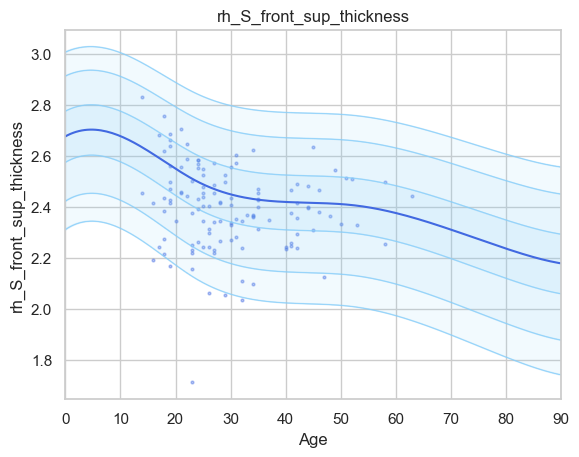

Running IDP 128 rh_S_interm_prim-Jensen_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17255155]), 'Rho': array([0.18770564]), 'pRho': array([0.03665937]), 'SMSE': array([1.35149479]), 'EXPV': array([-0.117554])}


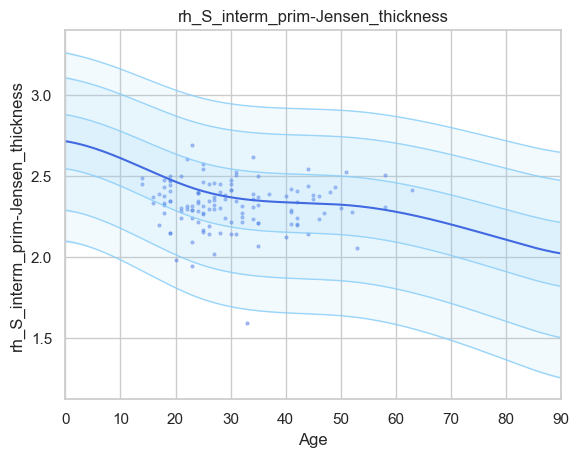

Running IDP 129 rh_S_intrapariet&P_trans_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13882812]), 'Rho': array([0.03054068]), 'pRho': array([0.73683169]), 'SMSE': array([1.63800021]), 'EXPV': array([-0.32662056])}


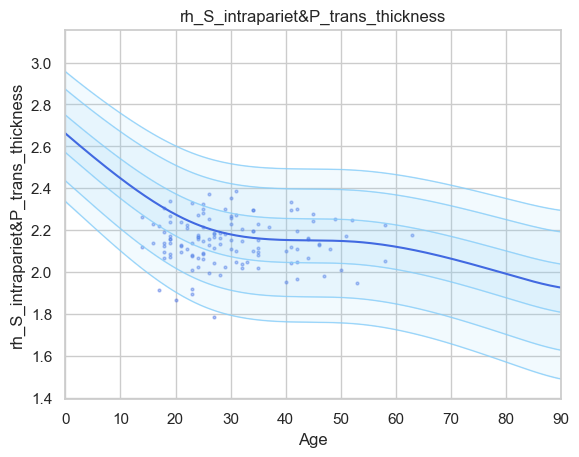

Running IDP 130 rh_S_oc_middle&Lunatus_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14877466]), 'Rho': array([0.02631713]), 'pRho': array([0.77215649]), 'SMSE': array([1.24194677]), 'EXPV': array([-0.24153458])}


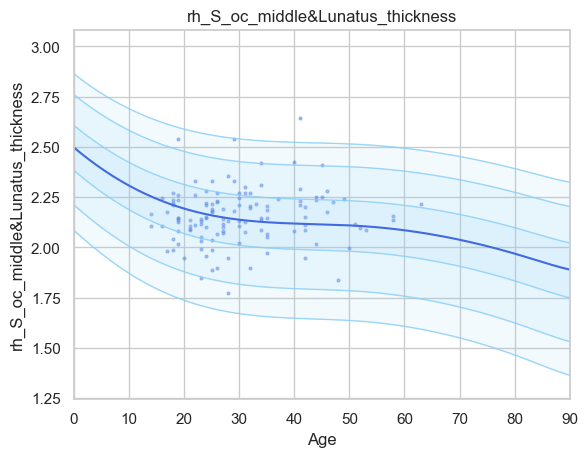

Running IDP 131 rh_S_oc_sup&transversal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13060959]), 'Rho': array([0.17532852]), 'pRho': array([0.05132549]), 'SMSE': array([1.09295993]), 'EXPV': array([-0.0269171])}


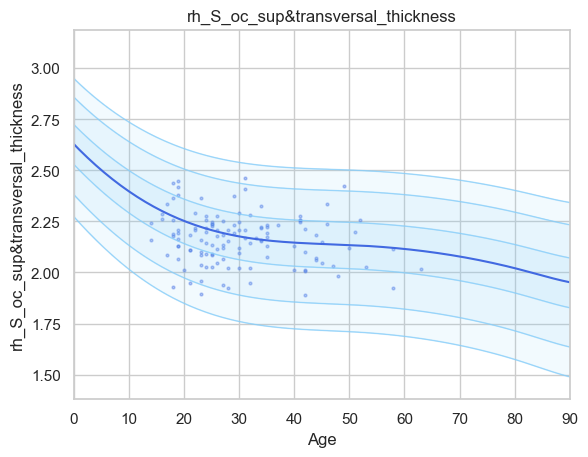

Running IDP 132 rh_S_occipital_ant_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.16929071]), 'Rho': array([0.12329533]), 'pRho': array([0.1728244]), 'SMSE': array([1.38857391]), 'EXPV': array([-0.27227641])}


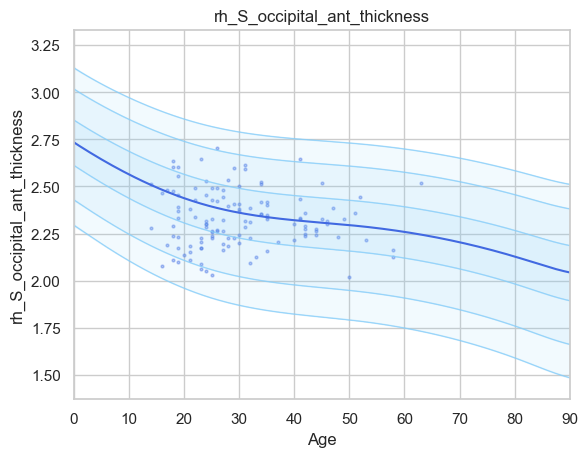

Running IDP 133 rh_S_oc-temp_lat_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.21940031]), 'Rho': array([-0.09587289]), 'pRho': array([0.29012345]), 'SMSE': array([1.22011227]), 'EXPV': array([-0.21400482])}


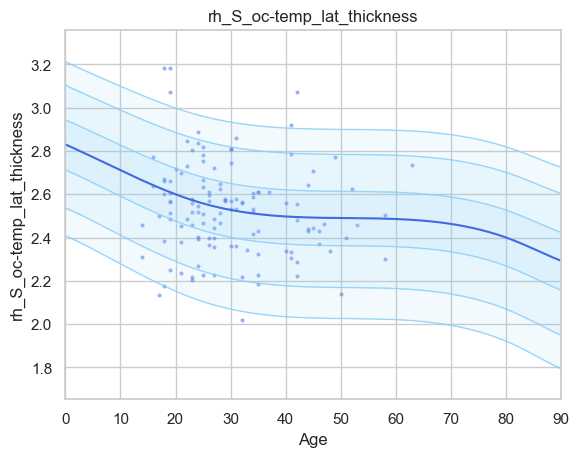

Running IDP 134 rh_S_oc-temp_med&Lingual_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14777015]), 'Rho': array([0.25825559]), 'pRho': array([0.00365354]), 'SMSE': array([1.18736901]), 'EXPV': array([0.0427461])}


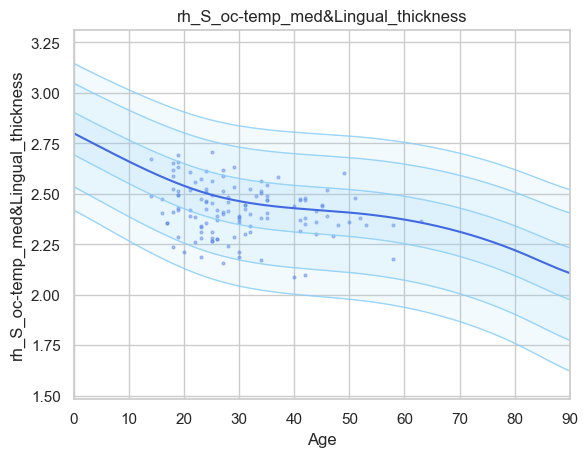

Running IDP 135 rh_S_orbital_lateral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22954659]), 'Rho': array([0.84906629]), 'pRho': array([3.32683627e-43]), 'SMSE': array([0.35366969]), 'EXPV': array([0.71271538])}


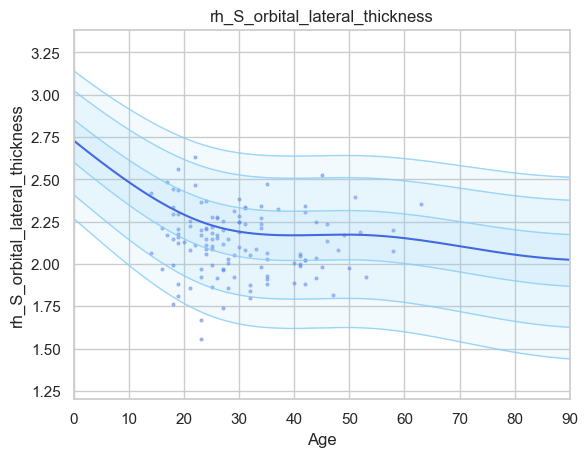

Running IDP 136 rh_S_orbital_med-olfact_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.2125879]), 'Rho': array([0.76188769]), 'pRho': array([3.50876083e-28]), 'SMSE': array([0.51090161]), 'EXPV': array([0.53050271])}


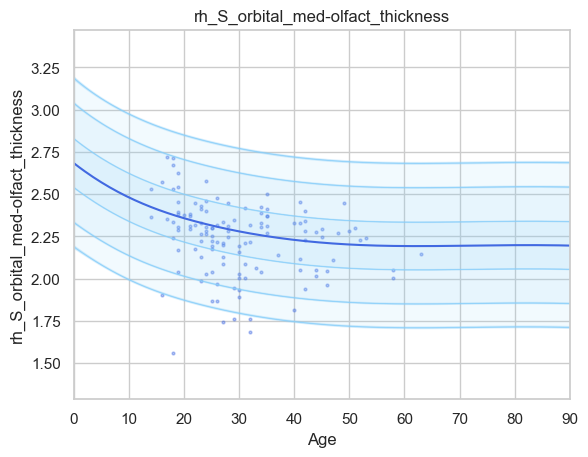

Running IDP 137 rh_S_orbital-H_Shaped_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.22714534]), 'Rho': array([0.87363075]), 'pRho': array([9.32608756e-50]), 'SMSE': array([0.32295223]), 'EXPV': array([0.7476305])}


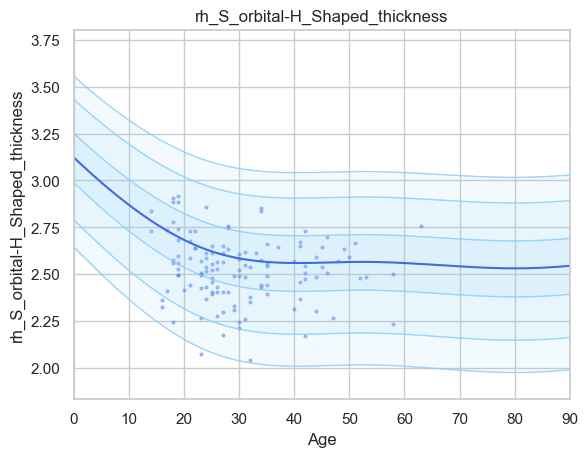

Running IDP 138 rh_S_parieto_occipital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.14475917]), 'Rho': array([0.1726028]), 'pRho': array([0.05513262]), 'SMSE': array([1.07577759]), 'EXPV': array([-0.05968713])}


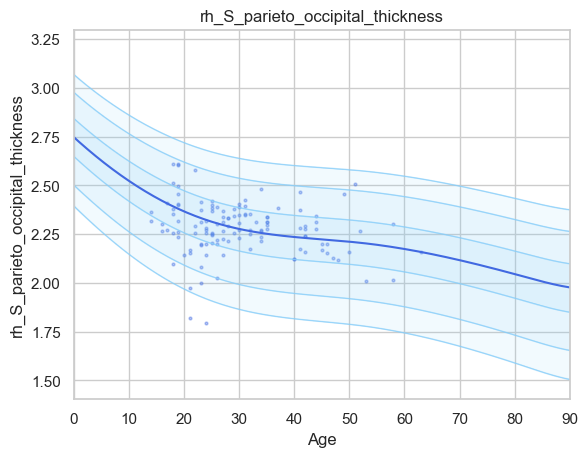

Running IDP 139 rh_S_pericallosal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19417008]), 'Rho': array([0.48016034]), 'pRho': array([8.65807954e-09]), 'SMSE': array([0.8066596]), 'EXPV': array([0.22951802])}


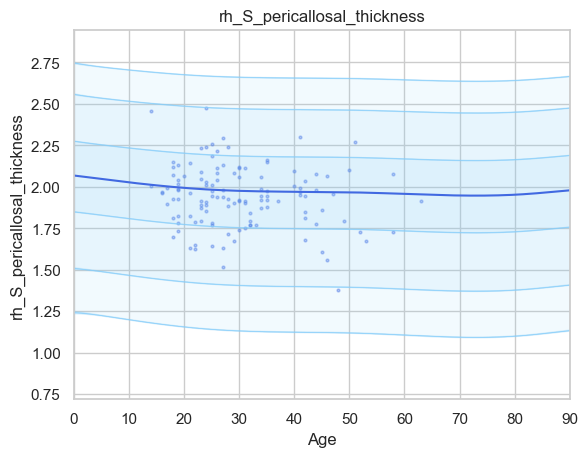

Running IDP 140 rh_S_postcentral_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15510994]), 'Rho': array([0.19967047]), 'pRho': array([0.02599526]), 'SMSE': array([1.61438122]), 'EXPV': array([-0.21311141])}


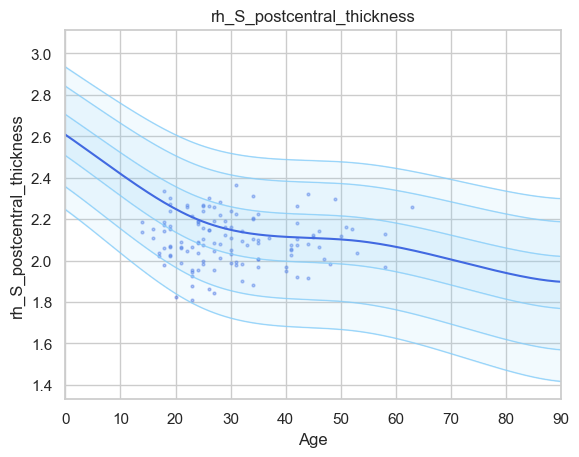

Running IDP 141 rh_S_precentral-inf-part_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.15932936]), 'Rho': array([0.56595683]), 'pRho': array([1.70018599e-12]), 'SMSE': array([0.93234912]), 'EXPV': array([0.29708859])}


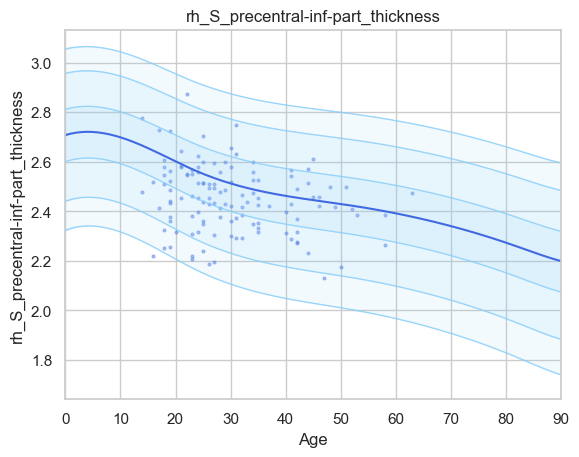

Running IDP 142 rh_S_precentral-sup-part_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.17357649]), 'Rho': array([0.26741205]), 'pRho': array([0.00257133]), 'SMSE': array([1.38315471]), 'EXPV': array([-0.04635295])}


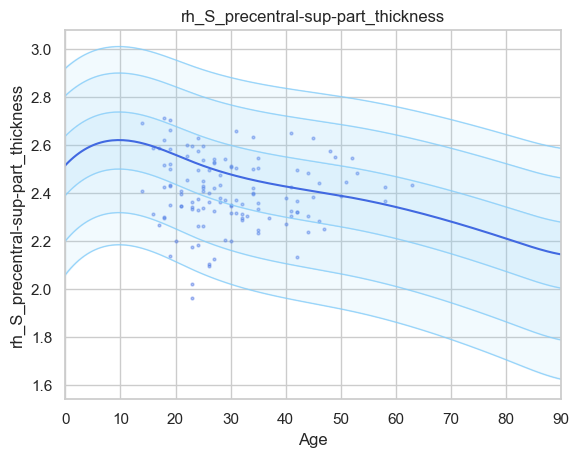

Running IDP 143 rh_S_suborbital_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.23538405]), 'Rho': array([0.6252935]), 'pRho': array([7.02098336e-16]), 'SMSE': array([0.6994947]), 'EXPV': array([0.38705822])}


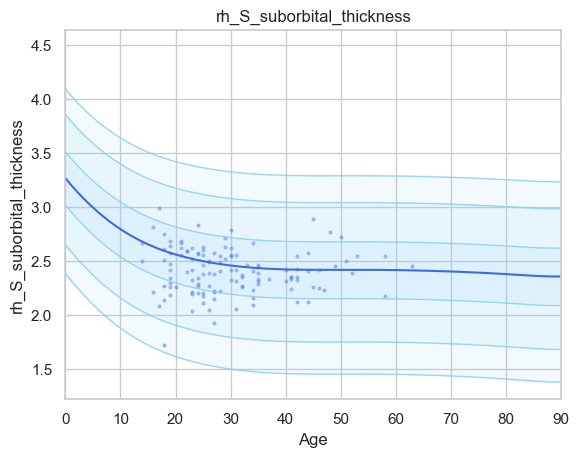

Running IDP 144 rh_S_subparietal_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.1536577]), 'Rho': array([0.20889857]), 'pRho': array([0.01968948]), 'SMSE': array([1.10950698]), 'EXPV': array([-0.00425083])}


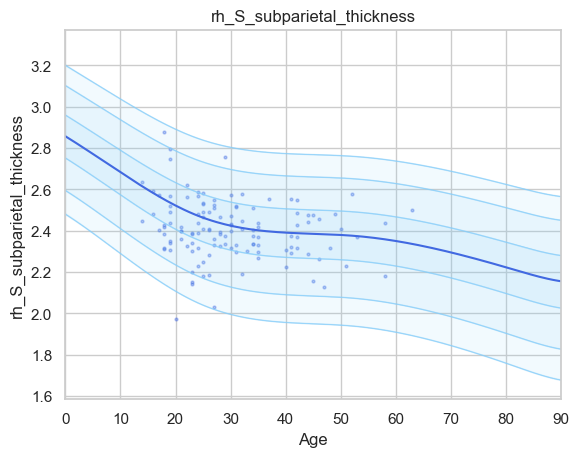

Running IDP 145 rh_S_temporal_inf_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13963237]), 'Rho': array([0.25618912]), 'pRho': array([0.00394807]), 'SMSE': array([1.07879636]), 'EXPV': array([0.02369075])}


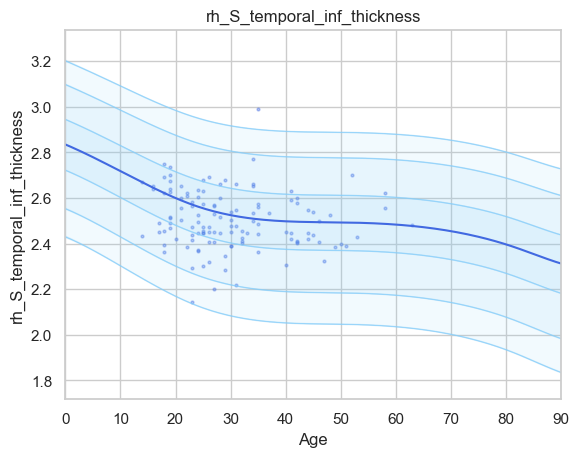

Running IDP 146 rh_S_temporal_sup_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.13378462]), 'Rho': array([0.40856475]), 'pRho': array([1.8171929e-06]), 'SMSE': array([1.05224598]), 'EXPV': array([0.06055121])}


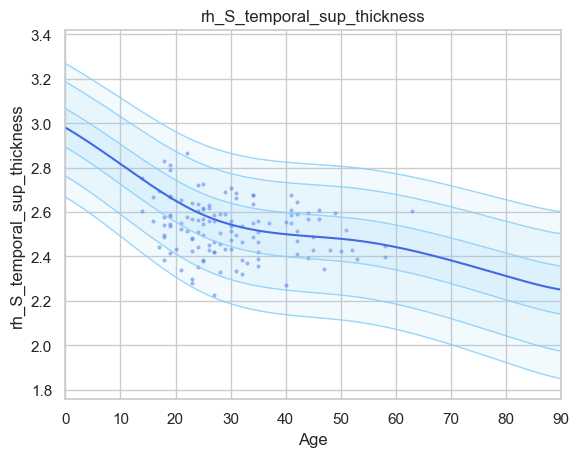

Running IDP 147 rh_S_temporal_transverse_thickness :
Making predictions with dummy covariates (for visualisation)
Loading data ...
Prediction by model  1 of 1
Writing outputs ...
metrics: {'RMSE': array([0.19391931]), 'Rho': array([0.16837645]), 'pRho': array([0.06149104]), 'SMSE': array([1.1242332]), 'EXPV': array([-0.07488635])}


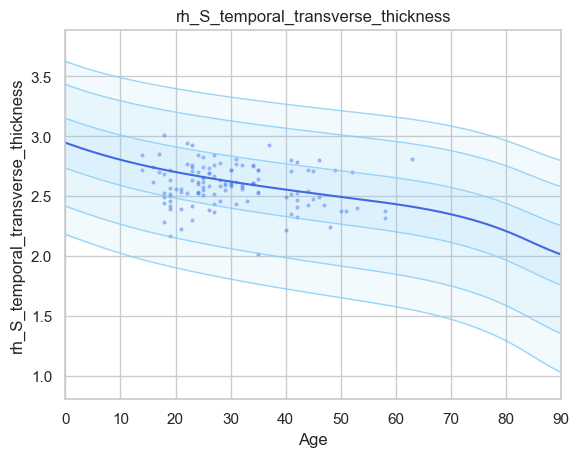

In [18]:
sns.set(style='whitegrid')

for idp_num, idp in enumerate(idp_ids): 
    print('Running IDP', idp_num, idp, ':')
    idp_dir = os.path.join(out_dir, idp)
    os.chdir(idp_dir)
    
    # load the true data points
    yhat_te = load_2d(os.path.join(idp_dir, 'yhat_predict.txt'))
    s2_te = load_2d(os.path.join(idp_dir, 'ys2_predict.txt'))
    y_te = load_2d(os.path.join(idp_dir, 'resp_te.txt'))
            
    # set up the covariates for the dummy data
    print('Making predictions with dummy covariates (for visualisation)')
    yhat, s2 = predict(cov_file_dummy, 
                       alg = 'blr', 
                       respfile = None, 
                       model_path = os.path.join(idp_dir,'Models'), 
                       outputsuffix = '_dummy')
    
    # load the normative model
    with open(os.path.join(idp_dir,'Models', 'NM_0_0_estimate.pkl'), 'rb') as handle:
        nm = pickle.load(handle) 
    
    # get the warp and warp parameters
    W = nm.blr.warp
    warp_param = nm.blr.hyp[1:nm.blr.warp.get_n_params()+1] 
        
    # first, we warp predictions for the true data and compute evaluation metrics
    med_te = W.warp_predictions(np.squeeze(yhat_te), np.squeeze(s2_te), warp_param)[0]
    med_te = med_te[:, np.newaxis]
    print('metrics:', evaluate(y_te, med_te))
    
    # then, we warp dummy predictions to create the plots
    med, pr_int = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param)
    
    # extract the different variance components to visualise
    beta, junk1, junk2 = nm.blr._parse_hyps(nm.blr.hyp, X_dummy)
    s2n = 1/beta # variation (aleatoric uncertainty)
    s2s = s2-s2n # modelling uncertainty (epistemic uncertainty)
    
    # plot the data points
    y_te_rescaled_all = np.zeros_like(y_te)
    for sid, site in enumerate(site_ids_te):
        # plot the true test data points 
        if all(elem in site_ids_tr for elem in site_ids_te):
            # all data in the test set are present in the training set
            
            # first, we select the data points belonging to this particular site
            idx = np.where(np.bitwise_and(X_te[:,2] == sex, X_te[:,sid+len(cols_cov)+1] !=0))[0]
            if len(idx) == 0:
                print('No data for site', sid, site, 'skipping...')
                continue
            
            # then directly adjust the data
            idx_dummy = np.bitwise_and(X_dummy[:,1] > X_te[idx,1].min(), X_dummy[:,1] < X_te[idx,1].max())
            y_te_rescaled = y_te[idx] - np.median(y_te[idx]) + np.median(med[idx_dummy])
        else:
            # we need to adjust the data based on the adaptation dataset 
            
            # first, select the data point belonging to this particular site
            idx = np.where(np.bitwise_and(X_te[:,2] == sex, (df_te['site'] == site).to_numpy()))[0]
            
            # load the adaptation data
            y_ad = load_2d(os.path.join(idp_dir, 'resp_ad.txt'))
            X_ad = load_2d(os.path.join(idp_dir, 'cov_bspline_ad.txt'))
            idx_a = np.where(np.bitwise_and(X_ad[:,2] == sex, (df_ad['site'] == site).to_numpy()))[0]
            if len(idx) < 2 or len(idx_a) < 2:
                print('Insufficent data for site', sid, site, 'skipping...')
                continue
            
            # adjust and rescale the data
            y_te_rescaled, s2_rescaled = nm.blr.predict_and_adjust(nm.blr.hyp, 
                                                                   X_ad[idx_a,:], 
                                                                   np.squeeze(y_ad[idx_a]), 
                                                                   Xs=None, 
                                                                   ys=np.squeeze(y_te[idx]))
        # plot the (adjusted) data points
        plt.scatter(X_te[idx,1], y_te_rescaled, s=4, color='royalblue', alpha = 0.4)
       
    # plot the median of the dummy data
    plt.plot(xx, med, 'royalblue')
    
    # fill the gaps in between the centiles
    junk, pr_int25 = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param, percentiles=[0.25,0.75])
    junk, pr_int95 = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param, percentiles=[0.05,0.95])
    junk, pr_int99 = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2), warp_param, percentiles=[0.01,0.99])
    plt.fill_between(xx, pr_int25[:,0], pr_int25[:,1], alpha = 0.1,color=clr)
    plt.fill_between(xx, pr_int95[:,0], pr_int95[:,1], alpha = 0.1,color=clr)
    plt.fill_between(xx, pr_int99[:,0], pr_int99[:,1], alpha = 0.1,color=clr)
            
    # make the width of each centile proportional to the epistemic uncertainty
    junk, pr_int25l = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2-0.5*s2s), warp_param, percentiles=[0.25,0.75])
    junk, pr_int95l = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2-0.5*s2s), warp_param, percentiles=[0.05,0.95])
    junk, pr_int99l = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2-0.5*s2s), warp_param, percentiles=[0.01,0.99])
    junk, pr_int25u = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2+0.5*s2s), warp_param, percentiles=[0.25,0.75])
    junk, pr_int95u = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2+0.5*s2s), warp_param, percentiles=[0.05,0.95])
    junk, pr_int99u = W.warp_predictions(np.squeeze(yhat), np.squeeze(s2+0.5*s2s), warp_param, percentiles=[0.01,0.99])    
    plt.fill_between(xx, pr_int25l[:,0], pr_int25u[:,0], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int95l[:,0], pr_int95u[:,0], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int99l[:,0], pr_int99u[:,0], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int25l[:,1], pr_int25u[:,1], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int95l[:,1], pr_int95u[:,1], alpha = 0.3,color=clr)
    plt.fill_between(xx, pr_int99l[:,1], pr_int99u[:,1], alpha = 0.3,color=clr)

    # plot actual centile lines
    plt.plot(xx, pr_int25[:,0],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int25[:,1],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int95[:,0],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int95[:,1],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int99[:,0],color=clr, linewidth=0.5)
    plt.plot(xx, pr_int99[:,1],color=clr, linewidth=0.5)
    
    plt.xlabel('Age')
    plt.ylabel(idp) 
    plt.title(idp)
    plt.xlim((0,90))
    plt.savefig(os.path.join(idp_dir, 'centiles_' + str(sex)),  bbox_inches='tight')
    plt.show()
    
os.chdir(out_dir)

In [13]:
! mkdir Z_SLE

In [14]:
import os
import shutil

# Assuming the current working directory is correct and contains the 'lifespan_57K_82sites' folder.
base_dir = 'D:/yanyi/PCNtoolkit-demo-main/PCNtoolkit-demo-main/braincharts-master16/braincharts-master/models'
lifespan_dir = 'lifespan_57K_82sites'

# New folder name for deviation scores
new_folder_name = 'Z_SLE'
new_folder_path = os.path.join(base_dir, lifespan_dir, new_folder_name)

# Create the new directory for deviation scores if it doesn't exist
os.makedirs(new_folder_path, exist_ok=True)

# Function to copy and rename files to avoid overwriting
def copy_and_rename_files(src_dir, dst_dir, filename):
    for root, dirs, files in os.walk(src_dir):
        for file in files:
            if file == filename:
                # Create a new file name using the parent directory of the file
                new_file_name = f"{os.path.basename(root)}_{file}"
                shutil.copy2(os.path.join(root, file), os.path.join(dst_dir, new_file_name))

# Copy and rename all 'Z_predict.txt' files
copy_and_rename_files(os.path.join(base_dir, lifespan_dir), new_folder_path, 'Z_predict.txt')

# List the files in the new directory to confirm they have been copied and renamed
copied_files = os.listdir(new_folder_path)
copied_files_paths = [os.path.join(new_folder_path, file) for file in copied_files]
copied_files_paths

['D:/yanyi/PCNtoolkit-demo-main/PCNtoolkit-demo-main/braincharts-master16/braincharts-master/models\\lifespan_57K_82sites\\Z_SLE\\lh_G&S_cingul-Ant_thickness_Z_predict.txt',
 'D:/yanyi/PCNtoolkit-demo-main/PCNtoolkit-demo-main/braincharts-master16/braincharts-master/models\\lifespan_57K_82sites\\Z_SLE\\lh_G&S_cingul-Mid-Ant_thickness_Z_predict.txt',
 'D:/yanyi/PCNtoolkit-demo-main/PCNtoolkit-demo-main/braincharts-master16/braincharts-master/models\\lifespan_57K_82sites\\Z_SLE\\lh_G&S_cingul-Mid-Post_thickness_Z_predict.txt',
 'D:/yanyi/PCNtoolkit-demo-main/PCNtoolkit-demo-main/braincharts-master16/braincharts-master/models\\lifespan_57K_82sites\\Z_SLE\\lh_G&S_frontomargin_thickness_Z_predict.txt',
 'D:/yanyi/PCNtoolkit-demo-main/PCNtoolkit-demo-main/braincharts-master16/braincharts-master/models\\lifespan_57K_82sites\\Z_SLE\\lh_G&S_occipital_inf_thickness_Z_predict.txt',
 'D:/yanyi/PCNtoolkit-demo-main/PCNtoolkit-demo-main/braincharts-master16/braincharts-master/models\\lifespan_57K_82

In [15]:
z_dir = 'D:/yanyi/PCNtoolkit-demo-main/PCNtoolkit-demo-main/braincharts-master16/braincharts-master/models/' + model_name + '/Z_SLE/'

filelist = [name for name in os.listdir(z_dir)]

In [16]:
import pandas as pd
os.chdir(z_dir)
Z_df = pd.concat([pd.read_csv(item, names=[item[:-4]]) for item in filelist], axis=1)

In [17]:
df_te.reset_index(inplace=True)

In [18]:
Z_df['sub_id'] = df_te['sub_id']

C:\Users\28935\AppData\Local\Temp\ipykernel_49680\1611314194.py:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  Z_df['sub_id'] = df_te['sub_id']


In [19]:
df_te_Z = pd.merge(df_te, Z_df, on='sub_id', how='inner')

In [20]:
df_te_Z.to_csv('ZSLE_scores.csv', index=False)

In [2]:
import pandas as pd

# 读取CSV文件
df = pd.read_csv('D:/yanyi/PCNtoolkit-demo-main/tutorials/HBR_FCONGMV/SLE_Z_estimate.csv')

# 替换操作
df = df.applymap(lambda x: 1 if x < -2.6 else 0)

# 保存更改后的数据回CSV文件
df.to_csv('D:/yanyi/PCNtoolkit-demo-main/tutorials/HBR_FCONGMV/SLE_Z_extreme.csv', index=False)

C:\Users\28935\AppData\Local\Temp\ipykernel_10548\1212061504.py:7: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df = df.applymap(lambda x: 1 if x < -2.6 else 0)
